In [1]:
from get_atten_importance import try_hook2, mask_head_with_api,plt_heatMap_sns,try_hook3
import sys
sys.path.append('../')
from utils.model_utils import load_gpt_model_and_tokenizer
import matplotlib.pyplot as plt
import os
import seaborn as sns
from transformers import AutoConfig, AutoTokenizer
import torch
import numpy as np
import pandas as pd
torch.set_grad_enabled(False)
from counterfact import CounterFactDataset
import torch
%matplotlib inline

In [2]:
check_token_id = -1
device = 'cuda:2'
model_name = 'EleutherAI/gpt-j-6b'  # 'EleutherAI/gpt-j-6b'
model_config = AutoConfig.from_pretrained(model_name)
n_layers = model_config.n_layer
n_heads = model_config.n_head

save_path = './result/atten_importance/'
x_ticks = [f"layer{i + 1}" for i in range(n_layers)]

In [3]:
model_config

GPTJConfig {
  "_name_or_path": "EleutherAI/gpt-j-6b",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTJForCausalLM"
  ],
  "attn_pdrop": 0.0,
  "bos_token_id": 50256,
  "embd_pdrop": 0.0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "initializer_range": 0.02,
  "layer_norm_epsilon": 1e-05,
  "model_type": "gptj",
  "n_embd": 4096,
  "n_head": 16,
  "n_inner": null,
  "n_layer": 28,
  "n_positions": 2048,
  "resid_pdrop": 0.0,
  "rotary": true,
  "rotary_dim": 64,
  "scale_attn_weights": true,
  "summary_activation": null,
  "summary_first_dropout": 0.1,
  "summary_proj_to_labels": true,
  "summary_type": "cls_index",
  "summary_use_proj": true,
  "task_specific_params": {
    "text-generation": {
      "do_sample": true,
      "max_length": 50,
      "temperature": 1.0
    }
  },
  "tie_word_embeddings": false,
  "tokenizer_class": "GPT2Tokenizer",
  "transformers_version": "4.35.2",
  "use_cache": true,
  "vocab_size": 50400
}

Loading:  EleutherAI/gpt-j-6b


Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


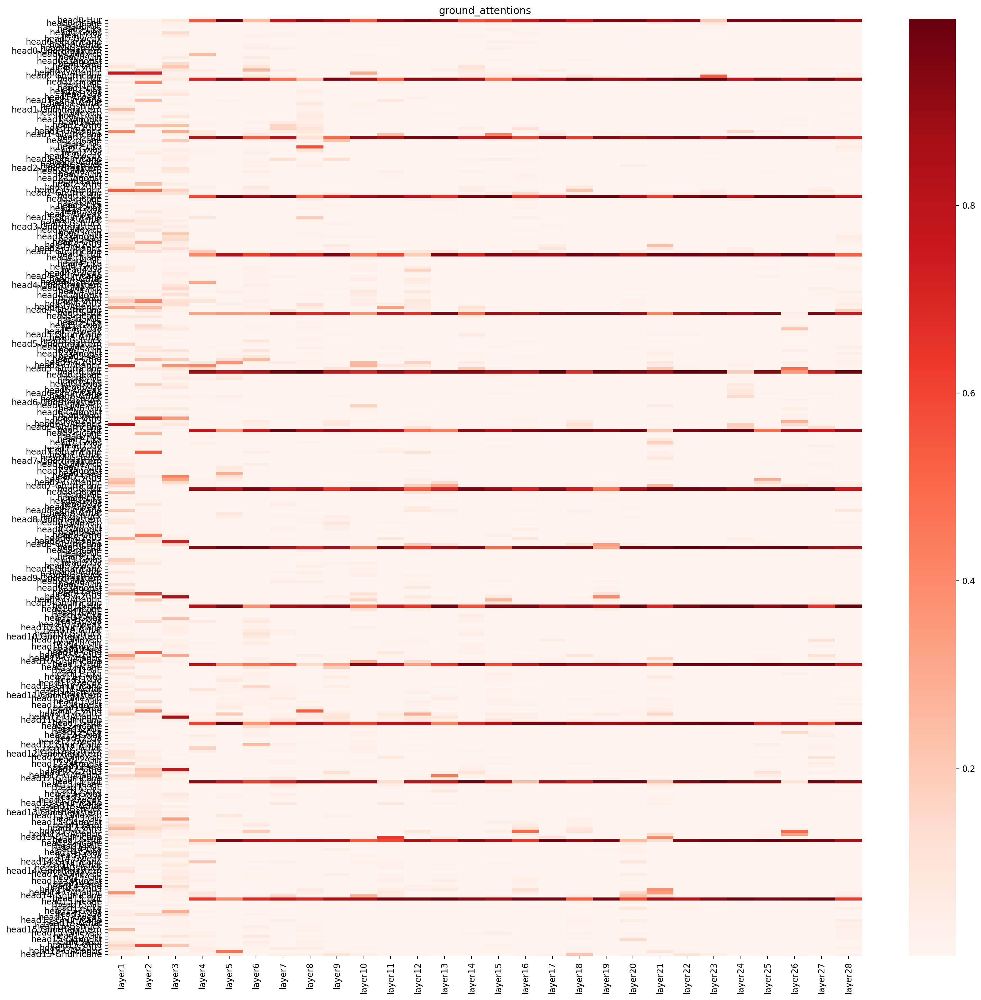

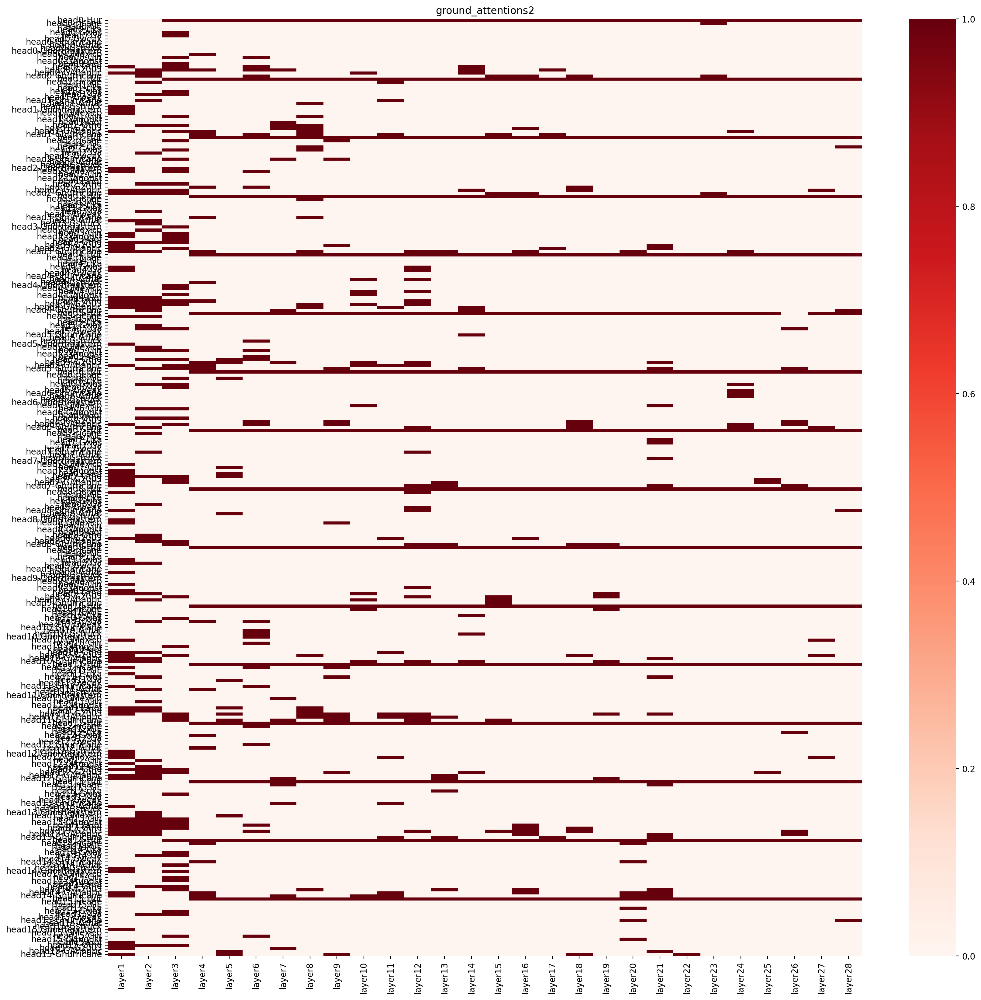

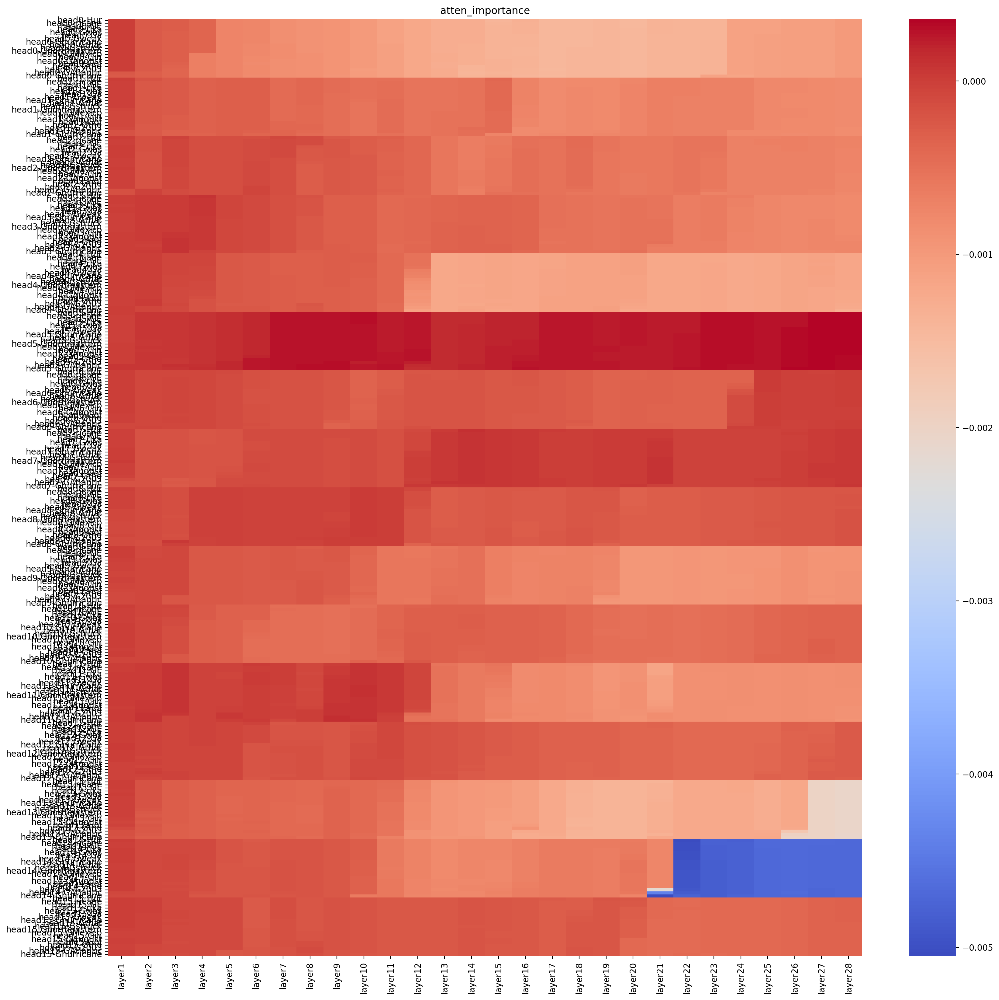

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


Loading:  EleutherAI/gpt-j-6b


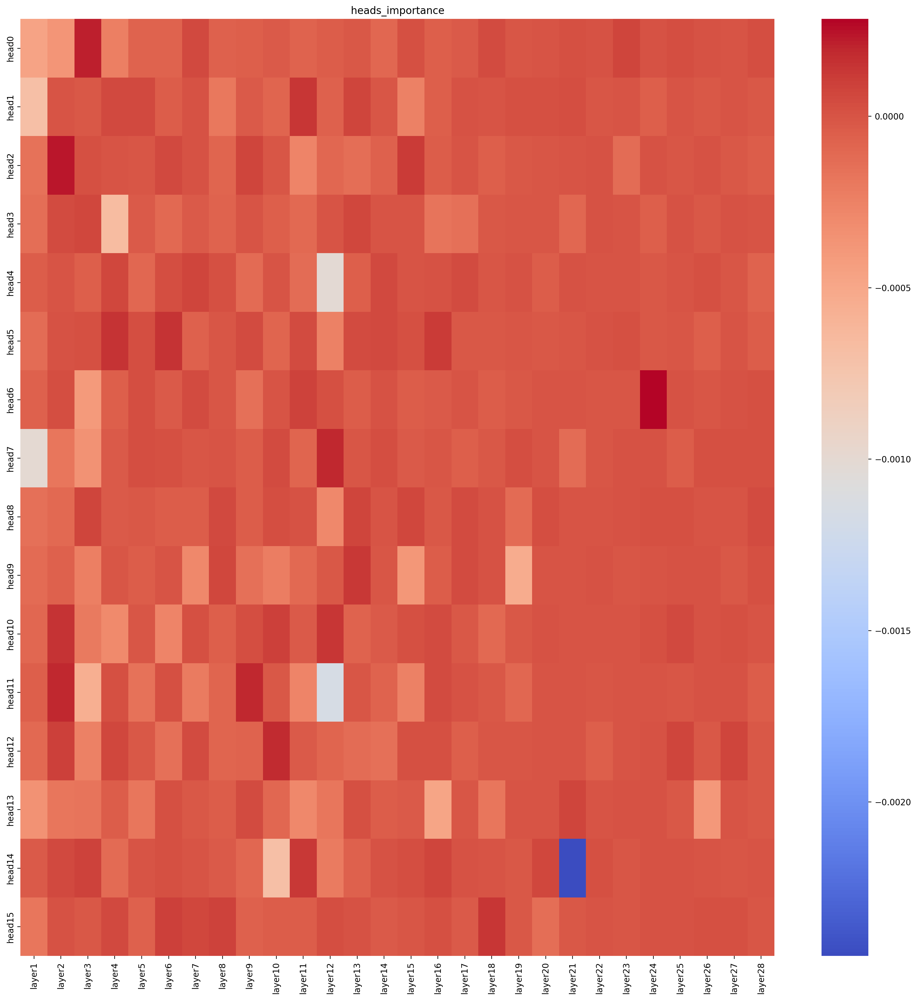

In [5]:
prompt = 'Hurricane Erika was a weak hurricane that struck northeastern Mexico in August of the 2003 Atlantic hurricane'#'Beats Music is owned by' #'Beats Music is owned by', 'The Space Needle is in downtown'
target_token = 'Apple' # season

ground_attentions, atten_importance = try_hook2(model_name, prompt, check_token_id, device)
# print(ground_attentions, atten_importance)
tokenizer = AutoTokenizer.from_pretrained(model_name)
encoded_line = tokenizer.encode(prompt)
codes = tokenizer.convert_ids_to_tokens(encoded_line)
y_ticks = []
for i_head in range(n_heads):
    for i, c in enumerate(codes):
        y_ticks.append(f"head{i_head}-{c}")
plt_heatMap_sns(ground_attentions.reshape(ground_attentions.shape[0], -1).T,
                title="ground_attentions", x_ticks=x_ticks, y_ticks=y_ticks
                ,show=True, save_path=save_path)
ground_attentions2 = np.where(ground_attentions>=(1/len(codes)), 1, 0)
plt_heatMap_sns(ground_attentions2.reshape(ground_attentions2.shape[0], -1).T,
                title="ground_attentions2", x_ticks=x_ticks, y_ticks=y_ticks
                , show=True, save_path=save_path)
plt_heatMap_sns(atten_importance.reshape(atten_importance.shape[0], -1).T,
                title="atten_importance",save_path=save_path,
                cmap=sns.color_palette("coolwarm", as_cmap=True),
                x_ticks=x_ticks, y_ticks=y_ticks
                ,show=True)

heads_importance = mask_head_with_api(model_name, prompt, -1, device)
plt_heatMap_sns(heads_importance, title="heads_importance", save_path=save_path,
                cmap=sns.color_palette("coolwarm", as_cmap=True),
                x_ticks=x_ticks, y_ticks=[f'head{i}' for i in range(n_heads)],
                show=True)

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


Loading:  EleutherAI/gpt-j-6b


Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


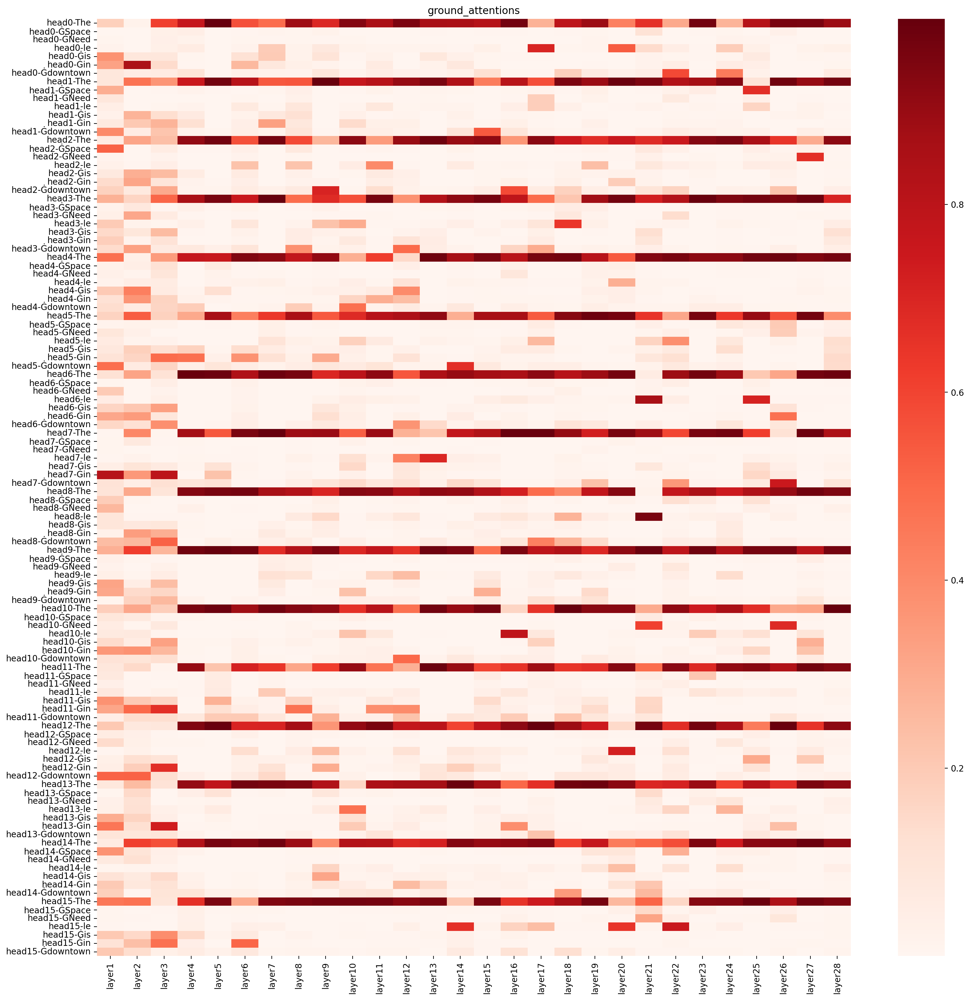

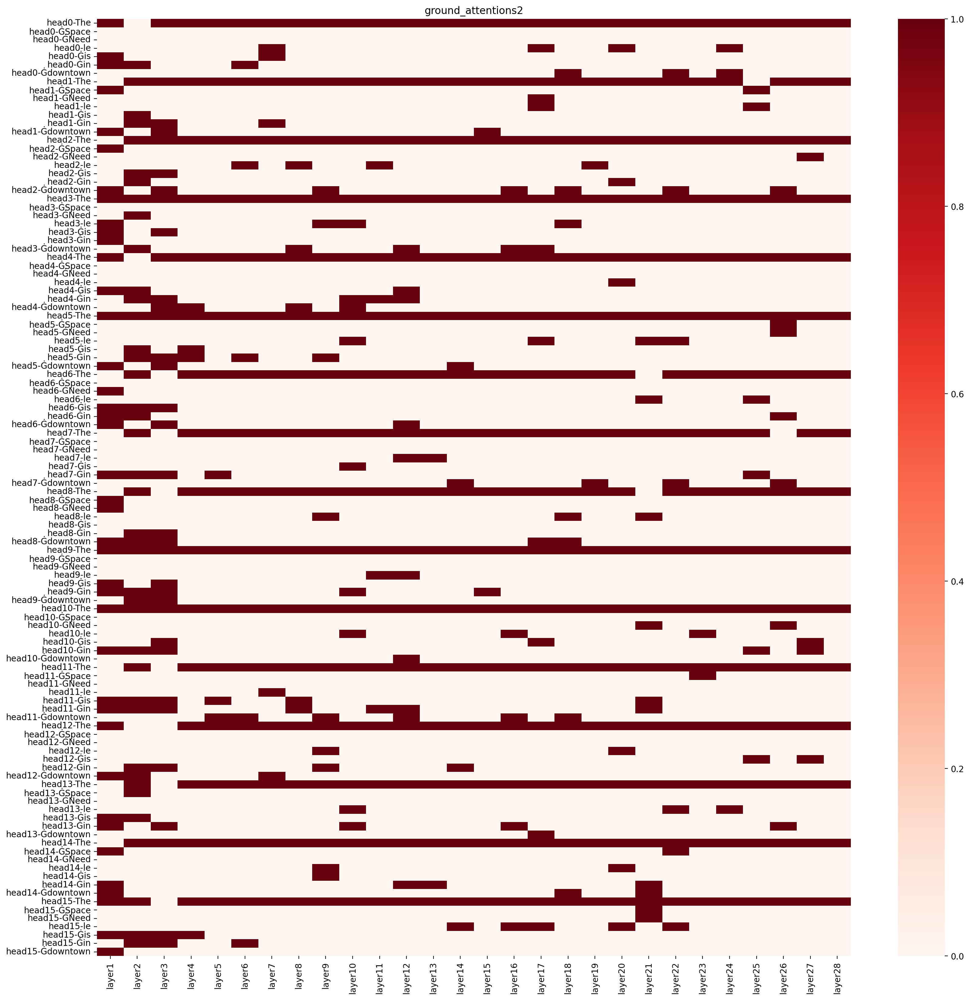

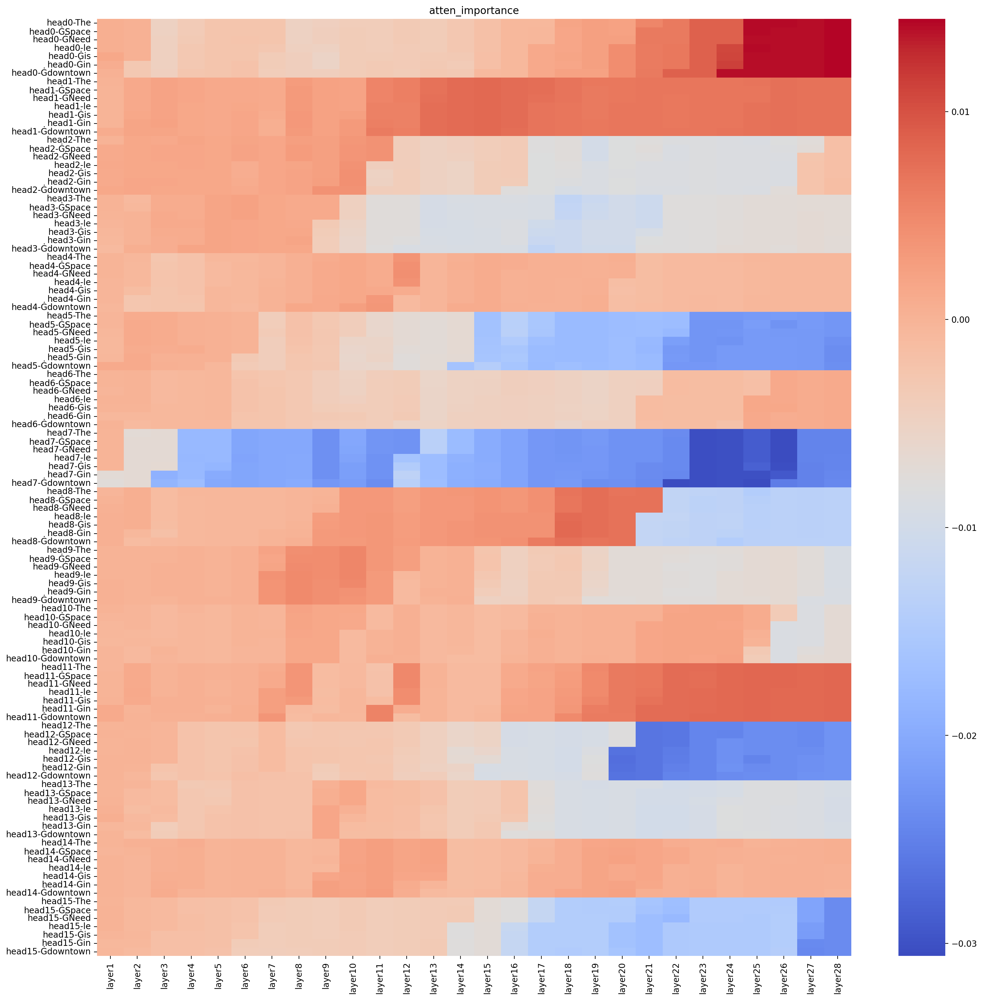

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


Loading:  EleutherAI/gpt-j-6b


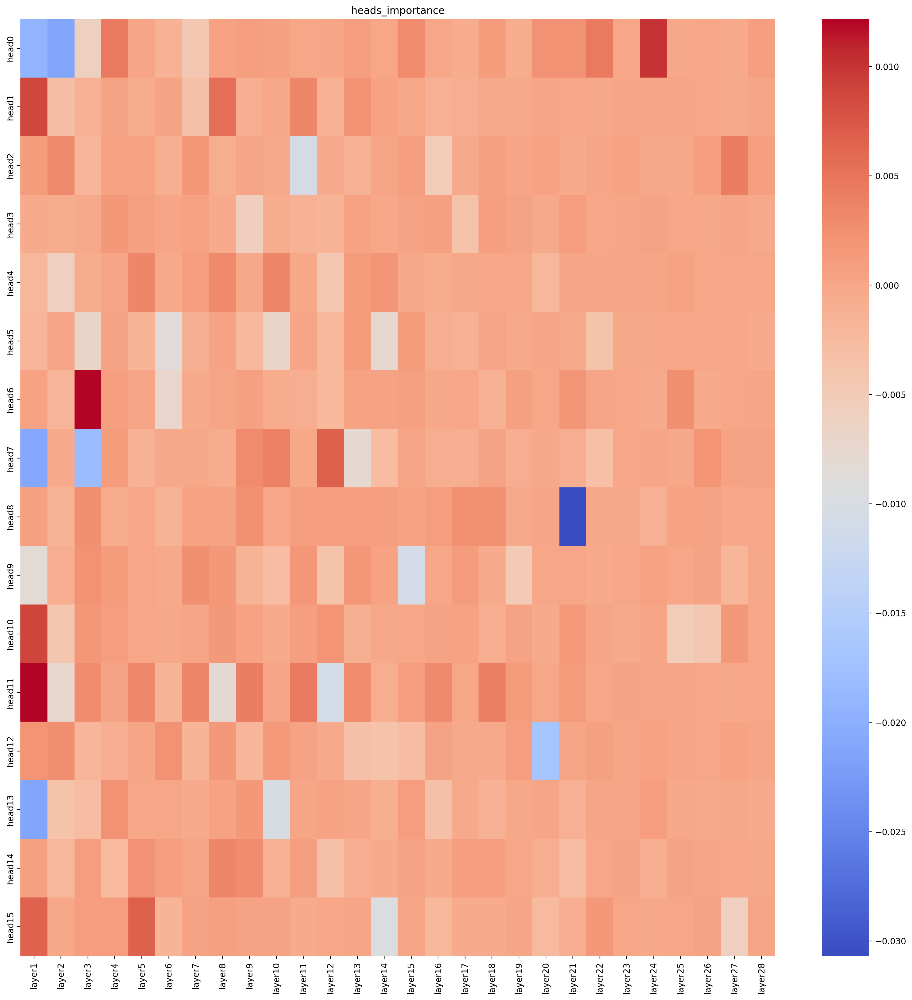

In [4]:
prompt =  'The Space Needle is in downtown' #'Beats Music is owned by',
target_token = 'Apple'

ground_attentions, atten_importance = try_hook2(model_name, prompt, check_token_id, device)
# print(ground_attentions, atten_importance)
tokenizer = AutoTokenizer.from_pretrained(model_name)
encoded_line = tokenizer.encode(prompt)
codes = tokenizer.convert_ids_to_tokens(encoded_line)
y_ticks = []
for i_head in range(n_heads):
    for i, c in enumerate(codes):
        y_ticks.append(f"head{i_head}-{c}")
plt_heatMap_sns(ground_attentions.reshape(ground_attentions.shape[0], -1).T,
                title="ground_attentions", x_ticks=x_ticks, y_ticks=y_ticks
                ,show=True, save_path=save_path)
ground_attentions2 = np.where(ground_attentions>=(1/len(codes)), 1, 0)
plt_heatMap_sns(ground_attentions2.reshape(ground_attentions2.shape[0], -1).T,
                title="ground_attentions2", x_ticks=x_ticks, y_ticks=y_ticks
                , show=True, save_path=save_path)
plt_heatMap_sns(atten_importance.reshape(atten_importance.shape[0], -1).T,
                title="atten_importance",save_path=save_path,
                cmap=sns.color_palette("coolwarm", as_cmap=True),
                x_ticks=x_ticks, y_ticks=y_ticks
                ,show=True)

heads_importance = mask_head_with_api(model_name, prompt, -1, device)
plt_heatMap_sns(heads_importance, title="heads_importance", save_path=save_path,
                cmap=sns.color_palette("coolwarm", as_cmap=True),
                x_ticks=x_ticks, y_ticks=[f'head{i}' for i in range(n_heads)],
                show=True)

In [15]:
dataset = CounterFactDataset('./data/')
dataset[0]

Loaded dataset with 21919 elements


{'case_id': 0,
 'pararel_idx': 2796,
 'requested_rewrite': {'prompt': 'The mother tongue of {} is',
  'relation_id': 'P103',
  'target_new': {'str': 'English', 'id': 'Q1860'},
  'target_true': {'str': 'French', 'id': 'Q150'},
  'subject': 'Danielle Darrieux'},
 'paraphrase_prompts': ['Shayna does this and Yossel goes still and dies. Danielle Darrieux, a native',
  'An album was recorded for Capitol Nashville but never released. Danielle Darrieux spoke the language'],
 'neighborhood_prompts': ['The mother tongue of Léon Blum is',
  'The native language of Montesquieu is',
  'François Bayrou, a native',
  'The native language of Raymond Barre is',
  'Michel Rocard is a native speaker of',
  'Jacques Chaban-Delmas is a native speaker of',
  'The native language of François Bayrou is',
  'Maurice Genevoix, speaker of',
  'The mother tongue of François Bayrou is',
  'Melchior de Vogüé, speaker of'],
 'attribute_prompts': ['J.\xa0R.\xa0R. Tolkien is a native speaker of',
  'The mother tongue

## /n + 0-27 zero

In [5]:
dataset = CounterFactDataset('./data/')
model, tokenizer, model_config = load_gpt_model_and_tokenizer(model_name, device, True)
n,greater_num,less_num = 0,0,0
for data in dataset[:300]:
    for p in data['neighborhood_prompts']: #'neighborhood_prompts']:
        target = data['requested_rewrite']['target_true']['str']
        # 获取softmax之之前的attention
        ground_attentions, change_attentions,(original_token_pos, original_token_score, new_result_original_token_score,new_result_token_pos, new_result_token_score, result) \
            = try_hook3(model, tokenizer, model_config, p, check_token_id, device)
        # print(np.sum(ground_attentions[:, :, check_token_id, :], axis=-1))
        if result[0] != result[1]:
            print("=============================")
            print(f"target:{target},prompt:{p}, (original, changed):{result}")
            print(f"original score:{original_token_score}, changed score:{new_result_token_score}")
            print("=============================")
        else:
            if new_result_token_score > original_token_score: greater_num = greater_num+1
            else : less_num +=1
        n += 1
print(f"score is higher: {greater_num}/{n}, score is lower: {less_num}/{n}")

Loaded dataset with 21919 elements
Loading:  EleutherAI/gpt-j-6b


Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


target:Christianity,prompt:The official religion of Charles Aznavour is, (original, changed):(' the', ' Catholicism')
original score:0.12470465898513794, changed score:0.10523804277181625
target:Christianity,prompt:The official religion of Paul is, (original, changed):(' the', ' Christianity')
original score:0.11728709936141968, changed score:0.11948291957378387
target:Christianity,prompt:The official religion of Nicolas Sarkozy is, (original, changed):(' the', ' Catholicism')
original score:0.15312528610229492, changed score:0.14641709625720978
target:guitar,prompt:Paul McCartney plays the instrument, (original, changed):(' he', 'als')
original score:0.06950303167104721, changed score:0.12057043612003326
target:guitar,prompt:John Lennon, playing the, (original, changed):(' role', ' guitar')
original score:0.14080214500427246, changed score:0.14723257720470428
target:guitar,prompt:Douglas Adams, playing the, (original, changed):(' part', ' role')
original score:0.23338140547275543, cha

target:Icelandic,prompt:The original language of Áramótaskaup 1973 is, (original, changed):(' available', ' a')
original score:0.0990011915564537, changed score:0.13944683969020844
target:Icelandic,prompt:The original language of Áramótaskaup 1969 is, (original, changed):(' available', ' a')
original score:0.10165595263242722, changed score:0.14500455558300018
target:Icelandic,prompt:The original language of Áramótaskaup 1968 is, (original, changed):(' available', ' a')
original score:0.095878466963768, changed score:0.13579615950584412
target:Porsche,prompt:Porsche 804 is created by, (original, changed):(' the', ' Porsche')
original score:0.10314419865608215, changed score:0.3382769525051117
target:bishop,prompt:Possidius of Calama is a, (original, changed):(' saint', ' Roman')
original score:0.1081523522734642, changed score:0.10466131567955017
target:bishop,prompt:Edwin Morris has the position of, (original, changed):(' the', ' Director')
original score:0.08497993648052216, changed 

target:opera,prompt:What does Leo Fall play? They play, (original, changed):(' a', ' the')
original score:0.09495837241411209, changed score:0.08974749594926834
target:Lyon,prompt:Panzani is headquartered in, (original, changed):(' Milan', ' the')
original score:0.07372801750898361, changed score:0.0969899520277977
target:Lyon,prompt:Fondation Mérieux's headquarters are in, (original, changed):(' the', ' Paris')
original score:0.2649734914302826, changed score:0.2535683810710907
target:Paris,prompt:Valéry Giscard d'Estaing worked in the city of, (original, changed):(' Nice', ' Paris')
original score:0.06535089015960693, changed score:0.19395627081394196
target:Paris,prompt:Vincent van Gogh used to work in, (original, changed):(' a', ' the')
original score:0.3955627977848053, changed score:0.35256391763687134
target:Ferrari,prompt:Ferrari F40, developed by, (original, changed):(' Pin', ' the')
original score:0.3050687611103058, changed score:0.15963377058506012
target:Ferrari,prompt:Fer

target:Hebrew,prompt:Rashi writes in, (original, changed):(' the', ' his')
original score:0.28387150168418884, changed score:0.43671128153800964
target:Hebrew,prompt:The language used by Johann Reuchlin is, (original, changed):(' not', ' a')
original score:0.06583231687545776, changed score:0.0828460082411766
target:Hebrew,prompt:The language used by Wilhelm Gesenius is, (original, changed):(' not', ' the')
original score:0.07626263797283173, changed score:0.07945980876684189
target:Hebrew,prompt:The language used by Ariel Sharon is, (original, changed):(' not', ' a')
original score:0.06461042910814285, changed score:0.07499775290489197
target:Italian,prompt:Lina Wertmüller speaks, (original, changed):(' to', ' about')
original score:0.22637072205543518, changed score:0.27808210253715515
target:Italian,prompt:Carlo Scarpa speaks, (original, changed):(' to', ' of')
original score:0.2134489268064499, changed score:0.18695564568042755
target:Italian,prompt:Marco Bellocchio speaks, (origin

target:English,prompt:Satyajit Ray speaks, (original, changed):(' to', ' about')
original score:0.2221909761428833, changed score:0.20957553386688232
target:English,prompt:Vladimir Putin speaks, (original, changed):(' during', ' at')
original score:0.3486533761024475, changed score:0.2008793205022812
target:English,prompt:The language used by Gottfried Wilhelm Leibniz is, (original, changed):(' often', ' a')
original score:0.08472838252782822, changed score:0.07342518866062164
target:actor,prompt:Mikhail Bulgakov's profession is an, (original, changed):(' important', ' artist')
original score:0.07233824580907822, changed score:0.25820669531822205
target:actor,prompt:Louis Armstrong's occupation is, (original, changed):(' a', ' listed')
original score:0.08426468819379807, changed score:0.08219107985496521
target:actor,prompt:Michael Jackson's profession is an, (original, changed):(' odd', ' entertain')
original score:0.07950127869844437, changed score:0.12589870393276215
target:Frankfur

target:cardinal,prompt:Clement VII, who holds the position of, (original, changed):(' the', ' Pope')
original score:0.18136398494243622, changed score:0.22680070996284485
target:cardinal,prompt:Alfons Maria Stickler holds the position of, (original, changed):(' the', ' Director')
original score:0.06810484081506729, changed score:0.06851150840520859
target:cardinal,prompt:Boniface II's position is, (original, changed):(' not', ' that')
original score:0.0673481896519661, changed score:0.1049697995185852
target:French,prompt:Jean-Luc Picard is a native speaker of, (original, changed):(' the', ' French')
original score:0.24801795184612274, changed score:0.554009735584259
target:London,prompt:Ben Wallace worked in the city of, (original, changed):(' Detroit', ' New')
original score:0.06320176273584366, changed score:0.09980203211307526
target:Microsoft,prompt:Rich Text Format was created by, (original, changed):(' Microsoft', ' the')
original score:0.17670758068561554, changed score:0.15197

target:French,prompt:The original language of Fantastic Planet is, (original, changed):(' Japanese', ' English')
original score:0.13481655716896057, changed score:0.11678128689527512
target:Damascus,prompt:Budapest is a twin city of, (original, changed):(' the', ' Budapest')
original score:0.08956339210271835, changed score:0.1944320648908615
target:Damascus,prompt:Toronto is a twin city of, (original, changed):(' New', ' Toronto')
original score:0.1247616782784462, changed score:0.40185102820396423
target:Damascus,prompt:São Paulo is a twin city of, (original, changed):(' New', ' S')
original score:0.09692883491516113, changed score:0.2403424233198166
target:Damascus,prompt:Beirut is a twin city of, (original, changed):(' the', ' Beirut')
original score:0.06308943033218384, changed score:0.2581214904785156
target:Florida,prompt:Joseph Janney Steinmetz worked in the city of, (original, changed):(' Chicago', ' New')
original score:0.08746910840272903, changed score:0.18332690000534058
t

target:NBC,prompt:Friends, season 7 was released on, (original, changed):(' DVD', ' Netflix')
original score:0.13899560272693634, changed score:0.19695167243480682
target:physics,prompt:The domain of work of Johannes Diderik van der Waals is, (original, changed):(' the', ' a')
original score:0.2459571361541748, changed score:0.11241531372070312
target:midfielder,prompt:Paul Scholes plays as, (original, changed):(' Manchester', ' a')
original score:0.2442607581615448, changed score:0.24681450426578522
target:midfielder,prompt:Ignacio Camacho, the, (original, changed):(' former', ' director')
original score:0.07191163301467896, changed score:0.06409259140491486
target:France,prompt:LNH player ID, in, (original, changed):(' the', ' order')
original score:0.18735067546367645, changed score:0.1604195088148117
target:France,prompt:LFH player ID is located in the country of, (original, changed):(' the', ' origin')
original score:0.2672148644924164, changed score:0.1763603687286377
target:Fran

target:Antarctica,prompt:Australian Antarctic Territory is a part of the continent of, (original, changed):(' Antarctica', ' Australia')
original score:0.7311433553695679, changed score:0.630647599697113
target:midfielder,prompt:Fabrice Ehret plays in the position of, (original, changed):(' a', ' the')
original score:0.2420896589756012, changed score:0.14886848628520966
target:midfielder,prompt:Zico plays in the position of, (original, changed):(' a', ' goalkeeper')
original score:0.28235769271850586, changed score:0.12572424113750458
target:midfielder,prompt:Igor Netto plays in the position of, (original, changed):(' a', ' the')
original score:0.2951706051826477, changed score:0.13278137147426605
target:midfielder,prompt:Edu Marangon, the, (original, changed):(' former', ' head')
original score:0.04106259346008301, changed score:0.025660429149866104
target:midfielder,prompt:Zico plays in the position of, (original, changed):(' a', ' goalkeeper')
original score:0.28235769271850586, cha

target:Chicago,prompt:Crucial Conflict, founded in, (original, changed):(' 1999', ' the')
original score:0.030874788761138916, changed score:0.05865995213389397
target:theology,prompt:The expertise of John Milbank is, (original, changed):(' well', ' a')
original score:0.06613843888044357, changed score:0.05862624570727348
target:theology,prompt:The expertise of Alexander Gerard is, (original, changed):(' in', ' a')
original score:0.0740726962685585, changed score:0.0695410817861557
target:theology,prompt:The domain of work of Amos Yong is, (original, changed):(' the', ' to')
original score:0.18281055986881256, changed score:0.13788220286369324
target:Yamaha,prompt:Yamaha XV 1100 Virago is a product of, (original, changed):(' Yamaha', ' the')
original score:0.4601181447505951, changed score:0.3161850869655609
target:Yamaha,prompt:Yamaha WR, created by, (original, changed):(' the', ' Yamaha')
original score:0.07669958472251892, changed score:0.11983323097229004
target:cardinal,prompt:Gas

target:Vancouver,prompt:The location of Vancouver Art Gallery is, (original, changed):(' a', ' in')
original score:0.10236210376024246, changed score:0.06657479703426361
target:Vancouver,prompt:The location of Lions Gate Bridge is, (original, changed):(' a', ' in')
original score:0.07413257658481598, changed score:0.06510864198207855
target:NBC,prompt:The City on the Edge of Forever premieres on, (original, changed):(' CBS', ' the')
original score:0.11576046794652939, changed score:0.0590423047542572
target:NBC,prompt:Freaks and Geeks premiered on, (original, changed):(' September', ' the')
original score:0.18722428381443024, changed score:0.09294188022613525
target:NBC,prompt:Miami Vice premieres on, (original, changed):(' Netflix', ' September')
original score:0.14609600603580475, changed score:0.11620138585567474
target:NBC,prompt:NBC Nightly News is to debut on, (original, changed):(' Monday', ' September')
original score:0.17574112117290497, changed score:0.14516615867614746
targe

target:Germany,prompt:Lower Saxony, in, (original, changed):(' the', ' Germany')
original score:0.33538195490837097, changed score:0.2986099123954773
target:linebacker,prompt:Omar Gaither plays as, (original, changed):(' if', ' a')
original score:0.16628339886665344, changed score:0.19148103892803192
target:linebacker,prompt:Nathan Stupar plays in the position of, (original, changed):(' a', ' the')
original score:0.19435440003871918, changed score:0.11183666437864304
target:linebacker,prompt:Josh Bynes plays in the position of, (original, changed):(' a', ' the')
original score:0.27801063656806946, changed score:0.11526846140623093
target:linebacker,prompt:Brendon Ayanbadejo plays in the position of, (original, changed):(' a', ' quarterback')
original score:0.0954703539609909, changed score:0.09246086329221725
target:Chevrolet,prompt:Chevrolet Engineering Research Vehicle is produced by, (original, changed):(' Chevrolet', ' the')
original score:0.21509306132793427, changed score:0.22114

target:quarterback,prompt:Aaron Brooks, the, (original, changed):(' former', ' author')
original score:0.0860215499997139, changed score:0.17524674534797668
target:quarterback,prompt:Chris Weinke plays in the position of, (original, changed):(' a', ' the')
original score:0.21316930651664734, changed score:0.12712833285331726
target:quarterback,prompt:Tom Osborne plays in the position of, (original, changed):(' a', ' quarterback')
original score:0.1428268998861313, changed score:0.2808787226676941
target:Madrid,prompt:Francisco Serrano, 1st Duke of la Torre died in, (original, changed):(' 16', ' the')
original score:0.1223982498049736, changed score:0.06638755649328232
target:Madrid,prompt:Ramón Serrano Suñer died in, (original, changed):(' Madrid', ' the')
original score:0.051621612161397934, changed score:0.04200141131877899
target:Madrid,prompt:Julián Marías passed away in, (original, changed):(' Madrid', ' the')
original score:0.10447174310684204, changed score:0.061026521027088165


target:Copenhagen,prompt:Marseille is a twin city of, (original, changed):(' Paris', ' Marse')
original score:0.19233599305152893, changed score:0.44051268696784973
target:Copenhagen,prompt:The twin city of Berlin is, (original, changed):(' a', ' the')
original score:0.15346555411815643, changed score:0.1392725706100464
target:Copenhagen,prompt:The twin city of Helsinki is, (original, changed):(' a', ' the')
original score:0.15442268550395966, changed score:0.14732828736305237
target:Zero,prompt:Jean Tinguely belongs to the organization of, (original, changed):(' artists', ' the')
original score:0.2172539085149765, changed score:0.2372862994670868
target:Zero,prompt:Yves Klein belongs to the organization of, (original, changed):(' artists', ' the')
original score:0.21212738752365112, changed score:0.38794881105422974
target:Canada,prompt:Anne of Green Gables, that was created in, (original, changed):(' the', ' 1908')
original score:0.11251160502433777, changed score:0.1662893295288086


target:Munich,prompt:Freddie Mercury used to work in, (original, changed):(' a', ' the')
original score:0.34630265831947327, changed score:0.3714553415775299
target:Princeton,prompt:Présent is based in, (original, changed):(' the', ' Paris')
original score:0.1393575221300125, changed score:0.1833735555410385
target:Princeton,prompt:Advaxis, whose headquarters are in, (original, changed):(' San', ' New')
original score:0.09331866353750229, changed score:0.17325112223625183
target:Pakistan,prompt:Kamila Shamsie, who holds a citizenship from, (original, changed):(' both', ' the')
original score:0.17683616280555725, changed score:0.21288302540779114
target:Azerbaijan,prompt:Salyan District is located in the country of, (original, changed):(' Armenia', ' India')
original score:0.1735459417104721, changed score:0.2649175822734833
target:composer,prompt:John Coltrane's profession is a, (original, changed):(' mystery', ' musician')
original score:0.12249287217855453, changed score:0.0941629633

target:Hebrew,prompt:The original language of Janem Janem was, (original, changed):(' written', ' a')
original score:0.06306274980306625, changed score:0.12228681147098541
target:Islam,prompt:Rasul Gamzatov follows the religion of, (original, changed):(' his', ' Islam')
original score:0.2780110538005829, changed score:0.35141289234161377
target:piano,prompt:Nikolai Rimsky-Korsakov plays, (original, changed):(' the', ' a')
original score:0.21727164089679718, changed score:0.15593010187149048
target:piano,prompt:Justus Frantz, the, (original, changed):(' owner', ' author')
original score:0.02378585934638977, changed score:0.049373649060726166
target:piano,prompt:Götz Alsmann plays the, (original, changed):(' piano', ' role')
original score:0.11343139410018921, changed score:0.1557779461145401
target:piano,prompt:Anton Rubinstein, the, (original, changed):(' founder', ' famous')
original score:0.04737171158194542, changed score:0.10025694966316223
target:piano,prompt:Hauschka plays, (orig

target:piano,prompt:Peter Igelhoff, the, (original, changed):(' former', ' author')
original score:0.03466792777180672, changed score:0.04328330233693123
target:piano,prompt:Mathilde Kralik plays the, (original, changed):(' piano', ' role')
original score:0.18468588590621948, changed score:0.22359587252140045
target:piano,prompt:Ingrid Haebler plays the, (original, changed):(' piano', ' role')
original score:0.15474075078964233, changed score:0.17988725006580353
target:piano,prompt:Hauschka plays the, (original, changed):(' piano', ' role')
original score:0.047432925552129745, changed score:0.16163402795791626
target:piano,prompt:Paul Badura-Skoda plays the, (original, changed):(' piano', ' role')
original score:0.0843256339430809, changed score:0.1367148607969284
target:piano,prompt:Robert Radecke, the, (original, changed):(' former', ' author')
original score:0.04603147134184837, changed score:0.04200749844312668
target:French,prompt:Jean-Luc Picard is a native speaker of, (original,

target:Chicago,prompt:Bogotá is a twin city of, (original, changed):(' the', ' Bog')
original score:0.11656816303730011, changed score:0.21692143380641937
target:Chicago,prompt:Milan is a twin city of, (original, changed):(' Rome', ' Milan')
original score:0.11737397313117981, changed score:0.16873882710933685
target:Amsterdam,prompt:The twin city of Zapopan is, (original, changed):(' located', ' the')
original score:0.16697555780410767, changed score:0.10952285677194595
target:Amsterdam,prompt:The twin city of Montreal is, (original, changed):(' a', ' the')
original score:0.15571345388889313, changed score:0.13841161131858826
target:Amsterdam,prompt:What is the twin city of Montreal? It is, (original, changed):(' a', ' the')
original score:0.244230255484581, changed score:0.2019139975309372
target:Amsterdam,prompt:Managua is a twin city of, (original, changed):(' Mexico', ' Man')
original score:0.09736137092113495, changed score:0.2579406499862671
target:Rochester,prompt:Giant Panda G

target:Fiat,prompt:Fiat Panorama is produced by, (original, changed):(' the', ' Fiat')
original score:0.19436508417129517, changed score:0.19695834815502167
target:Kiev,prompt:4A Games that was founded in, (original, changed):(' 1999', ' the')
original score:0.06860354542732239, changed score:0.04539107158780098
target:Antarctica,prompt:Antarctic Treaty System is in, (original, changed):(' the', ' place')
original score:0.10433213412761688, changed score:0.21735958755016327
target:Antarctica,prompt:South Orkney Islands belongs to the continent of, (original, changed):(' Antarctica', ' Europe')
original score:0.5110700130462646, changed score:0.16813473403453827
target:Antarctica,prompt:Alexander Island belongs to the continent of, (original, changed):(' Antarctica', ' Australia')
original score:0.5513023138046265, changed score:0.21343153715133667
target:Seoul,prompt:The twin city of San Francisco is, (original, changed):(' a', ' the')
original score:0.12277379631996155, changed score:

target:CBS,prompt:Cybill premieres on, (original, changed):(' the', ' CBS')
original score:0.0654839500784874, changed score:0.10801638662815094
target:CBS,prompt:CBS News premieres on, (original, changed):('-', ' the')
original score:0.07658402621746063, changed score:0.10306570678949356
target:CBS,prompt:Latin Grammy Awards was released on, (original, changed):(' November', ' the')
original score:0.1375574916601181, changed score:0.06672469526529312
target:Asia,prompt:Russia belongs to the continent of, (original, changed):(' Asia', ' Europe')
original score:0.35232090950012207, changed score:0.4694047272205353
target:Antarctica,prompt:Peter I Island belongs to the continent of, (original, changed):(' Europe', ' Australia')
original score:0.10583575814962387, changed score:0.14458094537258148
target:London,prompt:Babyshambles was formed in, (original, changed):(' 1994', ' the')
original score:0.13369350135326385, changed score:0.11692246794700623
target:London,prompt:Suede was founde

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


(28, 16, 6) (28, 16, 6)


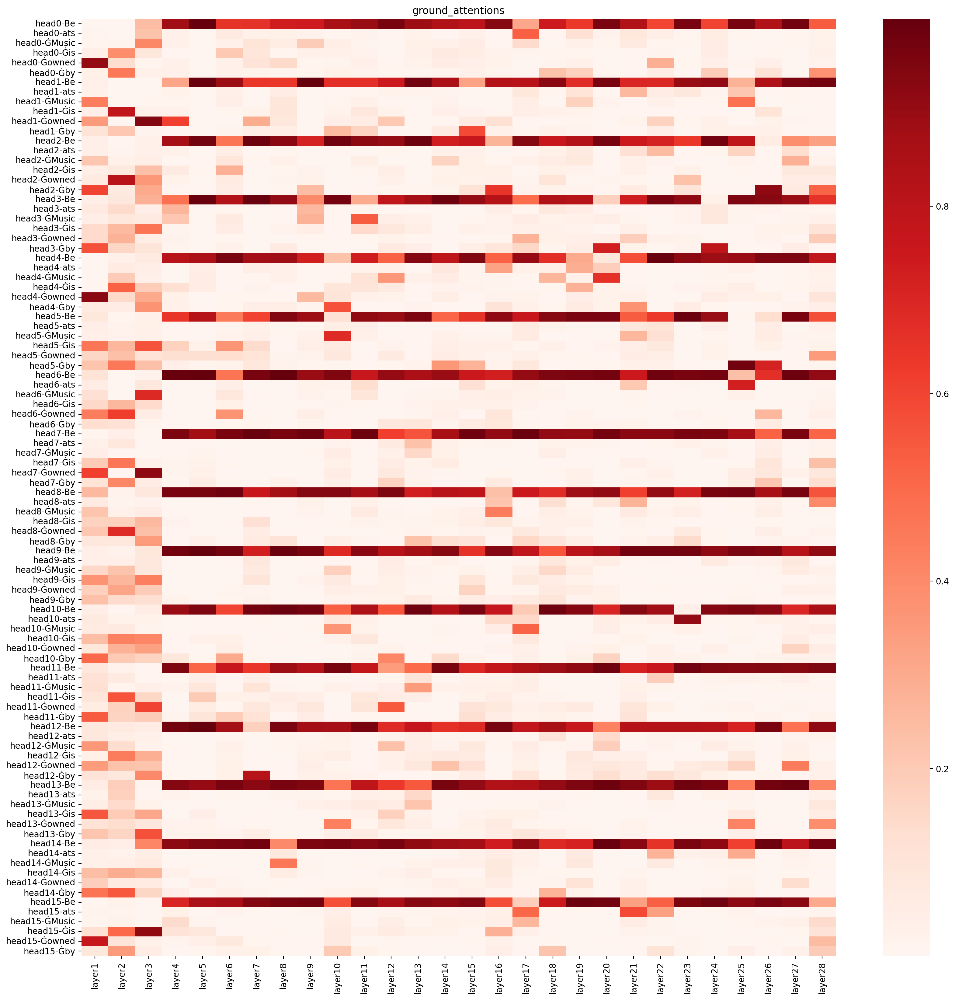

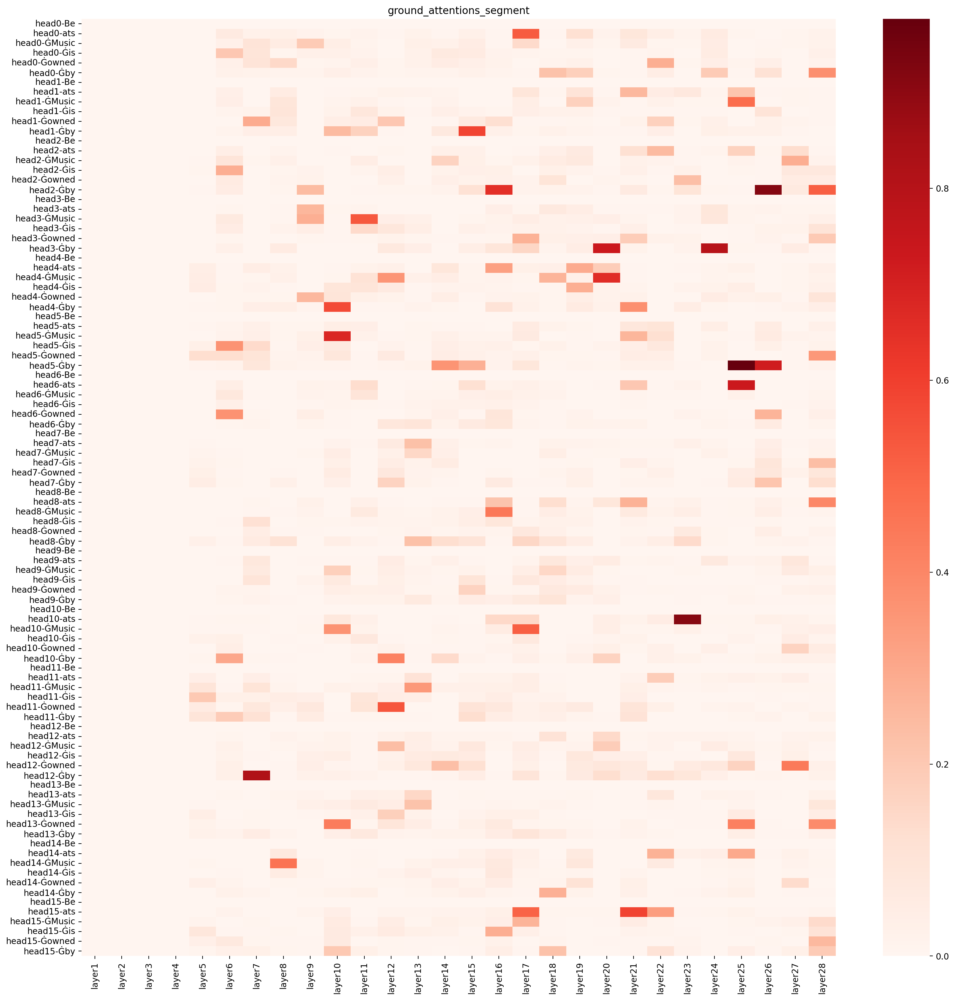

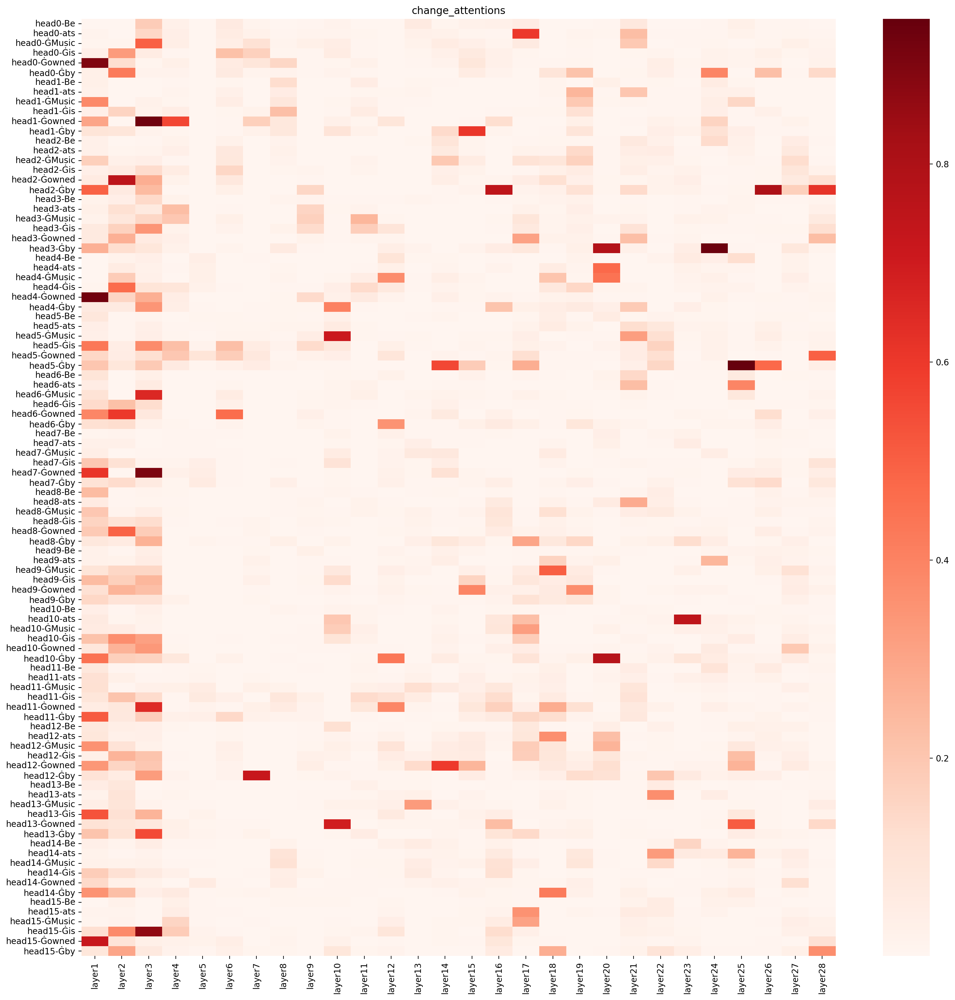

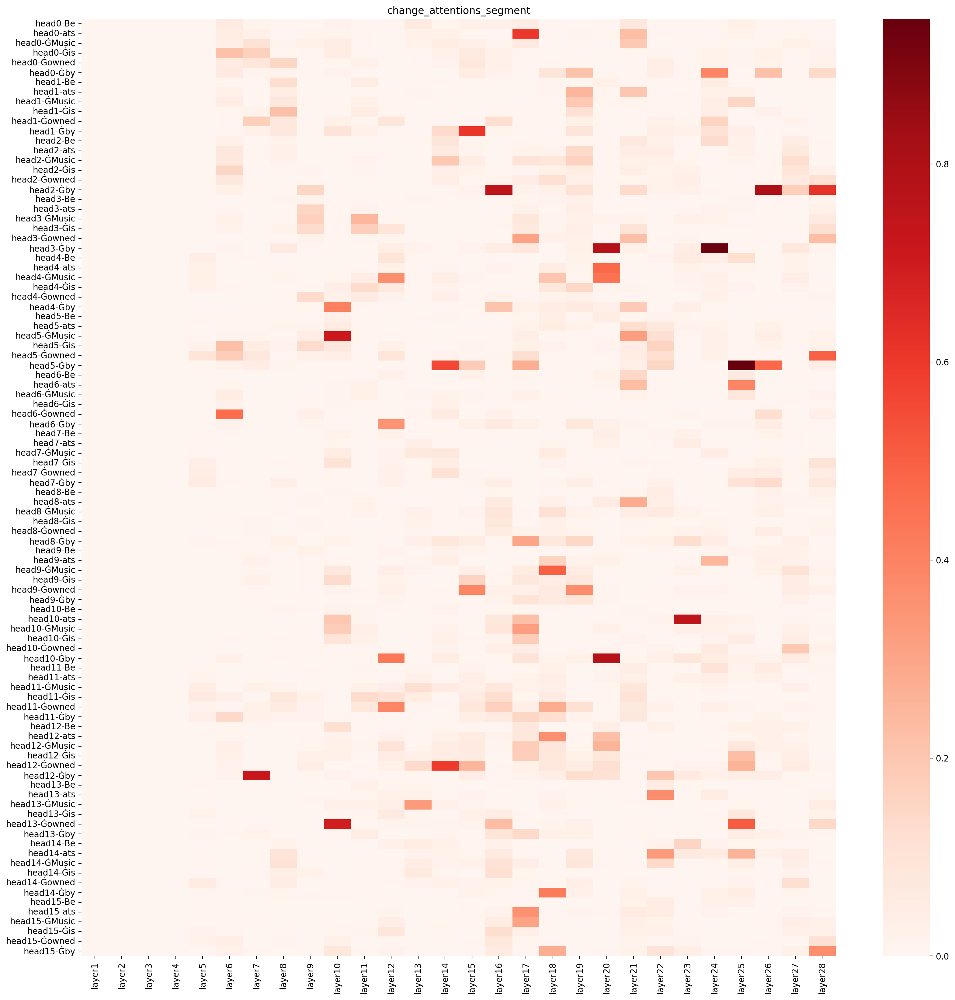

In [13]:
# model, tokenizer, model_config = load_gpt_model_and_tokenizer(model_name, device, True)
prompt =  'Beats Music is owned by' # 'Beats Music is owned by'  'The Space Needle is in downtown'

save_path = './result/atten_importance/'
x_ticks = [f"layer{i + 1}" for i in range(n_layers)]
tokenizer = AutoTokenizer.from_pretrained(model_name)
encoded_line = tokenizer.encode(prompt)
codes = tokenizer.convert_ids_to_tokens(encoded_line)

ground_attentions, change_attentions, (
original_token_pos, original_token_score, new_result_original_token_score, new_result_token_pos,
new_result_token_score, result) \
    = try_hook3(model, tokenizer, model_config, prompt, check_token_id, device)
ground_attentions,change_attentions = ground_attentions[:, :, check_token_id, :],change_attentions[:, :, check_token_id, 1:]
print(ground_attentions.shape, change_attentions.shape)
y_ticks = [f"head{i_head}-{c}" for i_head in range(n_heads) for i, c in enumerate(codes)]
plt_heatMap_sns(ground_attentions.reshape(ground_attentions.shape[0], -1).T,
                title="ground_attentions", x_ticks=x_ticks, y_ticks=y_ticks
                , show=True, save_path=save_path)
zero_attention = np.zeros_like(ground_attentions)
zero_attention[4:,:, 1:] = ground_attentions[4:,:, 1:]
plt_heatMap_sns(zero_attention.reshape(zero_attention.shape[0], -1).T,
                title="ground_attentions_segment", x_ticks=x_ticks, y_ticks=y_ticks
                , show=True, save_path=save_path)
plt_heatMap_sns(change_attentions.reshape(change_attentions.shape[0], -1).T,
                title="change_attentions", x_ticks=x_ticks, y_ticks=y_ticks
                , show=True, save_path=save_path)
zero_attention = np.zeros_like(change_attentions)
zero_attention[4:] = change_attentions[4:]
plt_heatMap_sns(zero_attention.reshape(zero_attention.shape[0], -1).T,
                title="change_attentions_segment", x_ticks=x_ticks, y_ticks=y_ticks
                , show=True, save_path=save_path)

## /n + 0-27 zero+relocate

In [3]:
from get_atten_importance import try_hook4
dataset = CounterFactDataset('./data/')
model, tokenizer, model_config = load_gpt_model_and_tokenizer(model_name, device, True)
n,greater_num,less_num = 0,0,0
for data in dataset[:100]:
    for p in data['neighborhood_prompts']: #'neighborhood_prompts']:
        target = data['requested_rewrite']['target_true']['str']
        # 获取softmax之之前的attention
        ground_attentions, change_attentions,(original_token_pos, original_token_score, new_result_original_token_score,new_result_token_pos, new_result_token_score, result) \
            = try_hook4(model, tokenizer, model_config, p, check_token_id, device)
        # print(np.sum(ground_attentions[:, :, check_token_id, :], axis=-1))
        if result[0] != result[1]:
            print("=============================")
            print(f"target:{target},prompt:{p}, (original, changed):{result}")
            print(f"original score:{original_token_score}, changed score:{new_result_token_score}")
            print("=============================")
        else:
            if new_result_token_score > original_token_score: greater_num = greater_num+1
            else : less_num +=1
        n += 1
print(f"score is higher: {greater_num}/{n}, score is lower: {less_num}/{n}")

Loaded dataset with 21919 elements
Loading:  EleutherAI/gpt-j-6b


Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


score is higher: 478/1000, score is lower: 522/1000


Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


(28, 16, 6) (28, 16, 6)


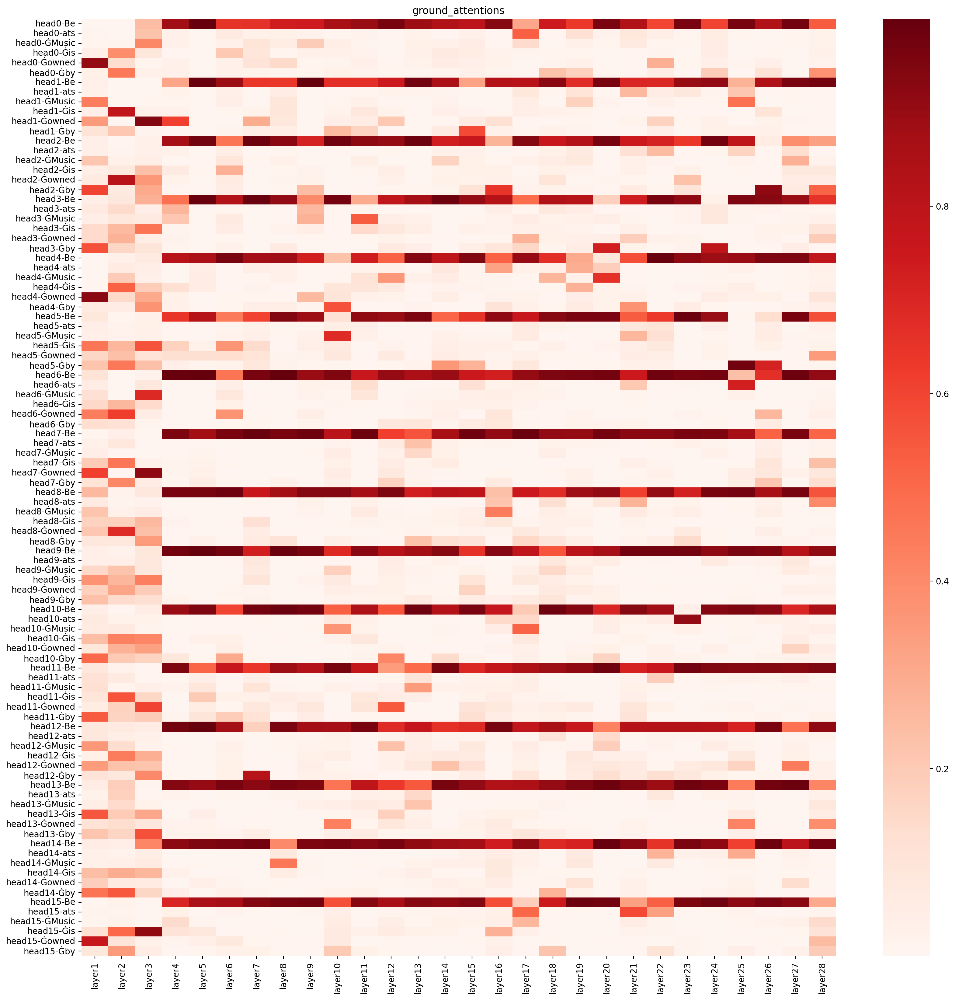

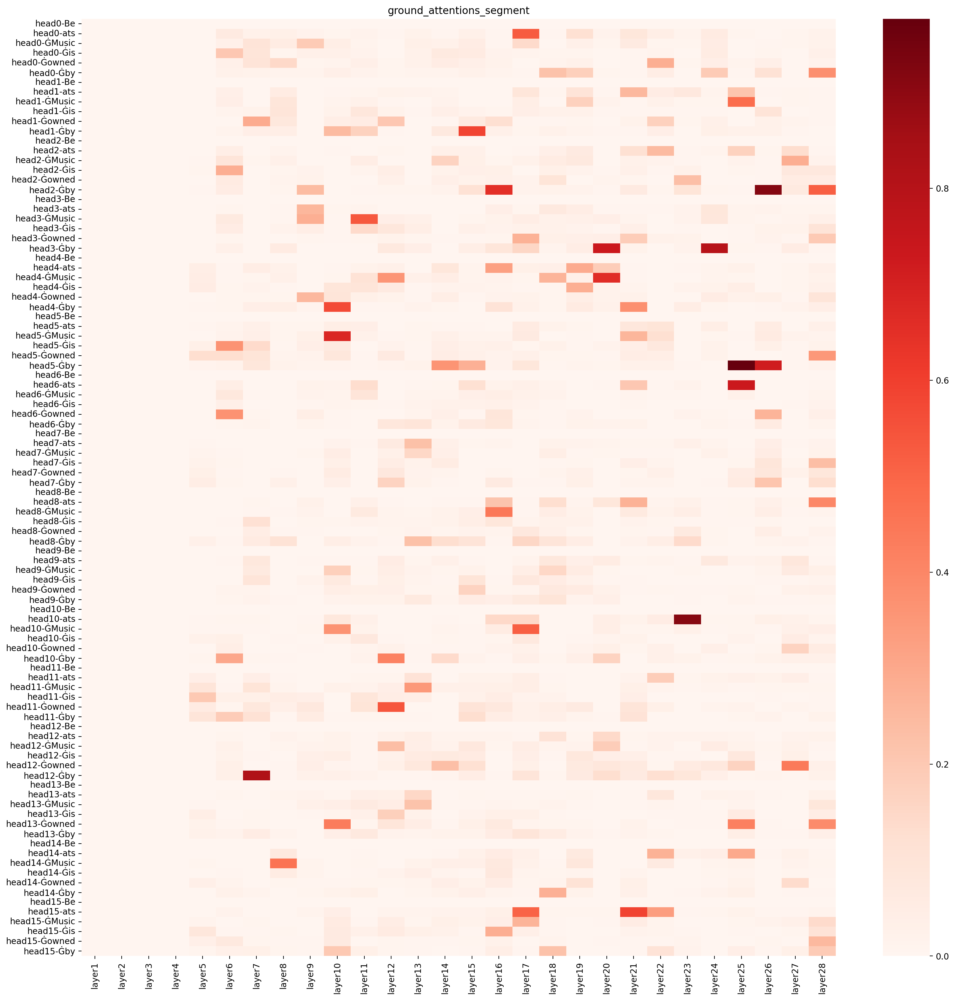

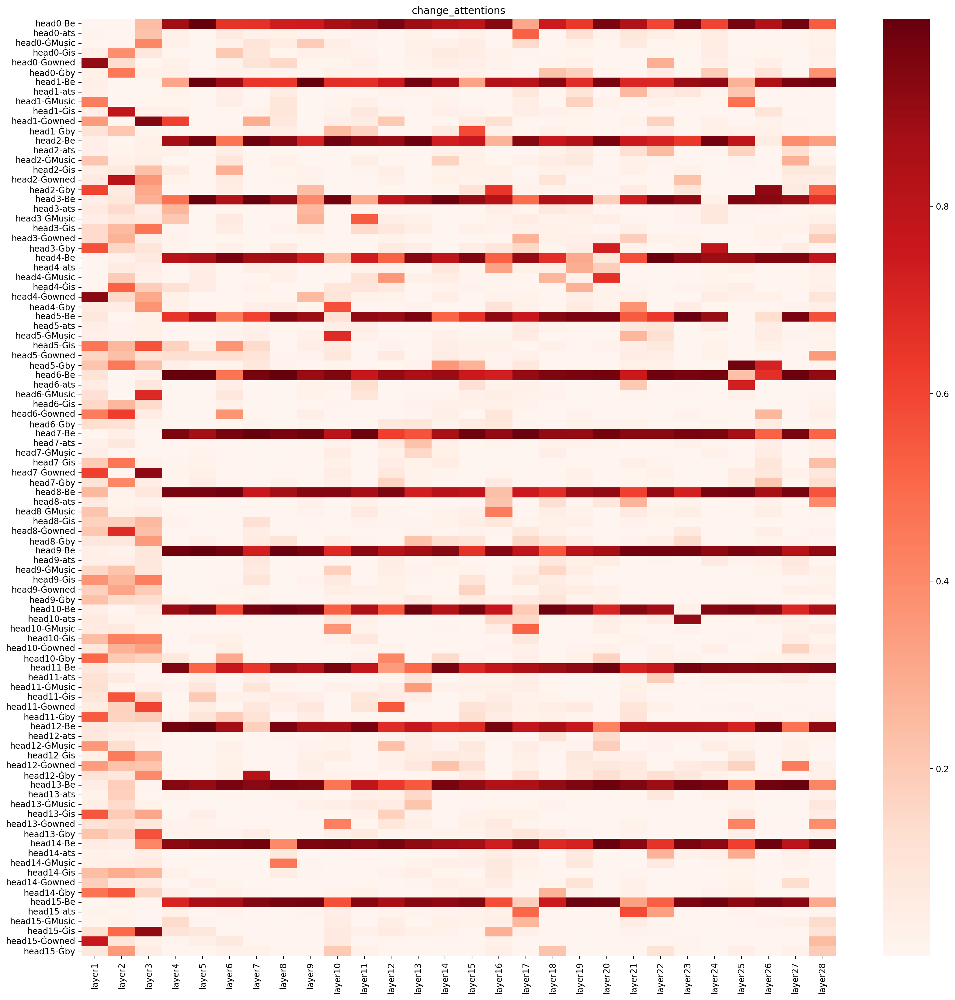

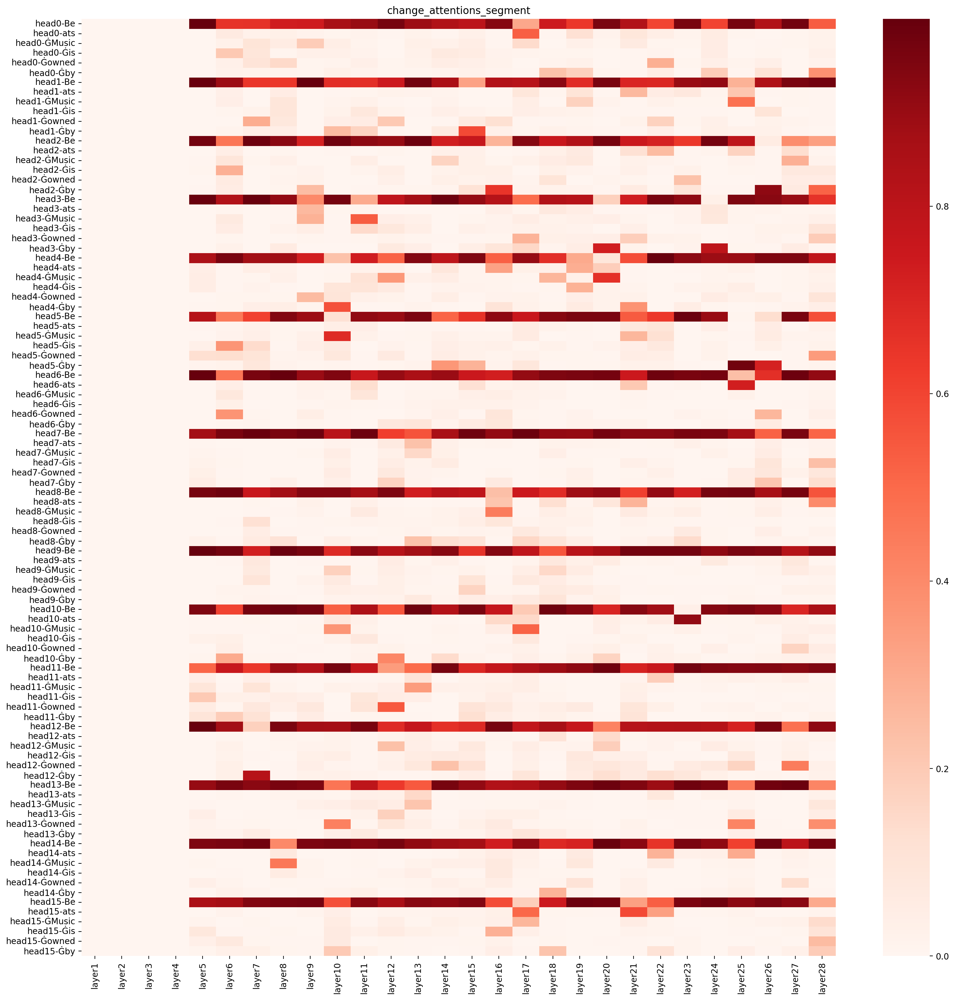

In [4]:
# model, tokenizer, model_config = load_gpt_model_and_tokenizer(model_name, device, True)
prompt =  'Beats Music is owned by' # 'Beats Music is owned by'  'The Space Needle is in downtown'

save_path = './result/atten_importance/'
x_ticks = [f"layer{i + 1}" for i in range(n_layers)]
tokenizer = AutoTokenizer.from_pretrained(model_name)
encoded_line = tokenizer.encode(prompt)
codes = tokenizer.convert_ids_to_tokens(encoded_line)

ground_attentions, change_attentions, (
original_token_pos, original_token_score, new_result_original_token_score, new_result_token_pos,
new_result_token_score, result) \
    = try_hook4(model, tokenizer, model_config, prompt, check_token_id, device)
ground_attentions,change_attentions = ground_attentions[:, :, check_token_id, :],change_attentions[:, :, check_token_id, 1:]
print(ground_attentions.shape, change_attentions.shape)
y_ticks = [f"head{i_head}-{c}" for i_head in range(n_heads) for i, c in enumerate(codes)]
plt_heatMap_sns(ground_attentions.reshape(ground_attentions.shape[0], -1).T,
                title="ground_attentions", x_ticks=x_ticks, y_ticks=y_ticks
                , show=True, save_path=save_path)
zero_attention = np.zeros_like(ground_attentions)
zero_attention[4:,:, 1:] = ground_attentions[4:,:, 1:]
plt_heatMap_sns(zero_attention.reshape(zero_attention.shape[0], -1).T,
                title="ground_attentions_segment", x_ticks=x_ticks, y_ticks=y_ticks
                , show=True, save_path=save_path)
plt_heatMap_sns(change_attentions.reshape(change_attentions.shape[0], -1).T,
                title="change_attentions", x_ticks=x_ticks, y_ticks=y_ticks
                , show=True, save_path=save_path)
zero_attention = np.zeros_like(change_attentions)
zero_attention[4:] = change_attentions[4:]
plt_heatMap_sns(zero_attention.reshape(zero_attention.shape[0], -1).T,
                title="change_attentions_segment", x_ticks=x_ticks, y_ticks=y_ticks
                , show=True, save_path=save_path)

## /n + 0-27 zero+relocate + /2

In [3]:
from get_atten_importance import try_hook4
dataset = CounterFactDataset('./data/')
model, tokenizer, model_config = load_gpt_model_and_tokenizer(model_name, device, True)
n,greater_num,less_num = 0,0,0
for data in dataset[:100]:
    for p in data['neighborhood_prompts']: #'neighborhood_prompts']:
        target = data['requested_rewrite']['target_true']['str']
        # 获取softmax之之前的attention
        ground_attentions, change_attentions,(original_token_pos, original_token_score, new_result_original_token_score,new_result_token_pos, new_result_token_score, result) \
            = try_hook4(model, tokenizer, model_config, p, check_token_id, device)
        # print(np.sum(ground_attentions[:, :, check_token_id, :], axis=-1))
        if result[0] != result[1]:
            print("=============================")
            print(f"target:{target},prompt:{p}, (original, changed):{result}")
            print(f"original score:{original_token_score}, changed score:{new_result_token_score}")
            print("=============================")
        else:
            if new_result_token_score > original_token_score: greater_num = greater_num+1
            else : less_num +=1
        n += 1
print(f"score is higher: {greater_num}/{n}, score is lower: {less_num}/{n}")

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


Loaded dataset with 21919 elements
Loading:  EleutherAI/gpt-j-6b
target:French,prompt:The mother tongue of Léon Blum is, (original, changed):(' French', ' a')
original score:0.28621625900268555, changed score:0.11373824626207352
target:French,prompt:The native language of Montesquieu is, (original, changed):(' French', ' a')
original score:0.29344016313552856, changed score:0.10792960971593857
target:French,prompt:François Bayrou, a native, (original, changed):(' of', ' English')
original score:0.9083408117294312, changed score:0.055114664137363434
target:French,prompt:The native language of Raymond Barre is, (original, changed):(' French', ' a')
original score:0.5994847416877747, changed score:0.12396713346242905
target:French,prompt:Michel Rocard is a native speaker of, (original, changed):(' French', ' the')
original score:0.6545122265815735, changed score:0.30275842547416687
target:French,prompt:Jacques Chaban-Delmas is a native speaker of, (original, changed):(' French', ' the')
o

target:Dutch,prompt:Giaches de Wert is a native speaker of, (original, changed):(' French', ' the')
original score:0.18629778921604156, changed score:0.30167195200920105
target:Dutch,prompt:Arend Lijphart is a native speaker of, (original, changed):(' Dutch', ' the')
original score:0.7190532088279724, changed score:0.30635103583335876
target:Dutch,prompt:The mother tongue of Henk van Woerden is, (original, changed):(' Dutch', ' a')
original score:0.40831050276756287, changed score:0.10661299526691437
target:Dutch,prompt:The mother tongue of Johannes Hendrikus Donner is, (original, changed):(' the', ' a')
original score:0.14637546241283417, changed score:0.10515374690294266
target:Dutch,prompt:Arend Lijphart spoke the language, (original, changed):(' of', '.')
original score:0.8677312731742859, changed score:0.1714819073677063
target:Dutch,prompt:The native language of Wilhelm de Haan is, (original, changed):(' Dutch', ' a')
original score:0.28669771552085876, changed score:0.1198253855

target:soccer,prompt:Megan Rapinoe plays, (original, changed):(' for', ' a')
original score:0.1496269255876541, changed score:0.26458343863487244
target:soccer,prompt:Tim Cahill, the, (original, changed):(' former', ' same')
original score:0.07689528167247772, changed score:0.012124892324209213
target:French,prompt:Melchior de Vogüé is a native speaker of, (original, changed):(' French', ' the')
original score:0.3224826753139496, changed score:0.31283292174339294
target:French,prompt:The native language of Léon Blum is, (original, changed):(' French', ' a')
original score:0.4742783010005951, changed score:0.12658095359802246
target:French,prompt:Léon Blum, a native, (original, changed):(' of', ' to')
original score:0.9136221408843994, changed score:0.049954965710639954
target:French,prompt:Ferdinand de Saussure is a native speaker of, (original, changed):(' French', ' the')
original score:0.32631704211235046, changed score:0.29355907440185547
target:French,prompt:The native language of

target:Icelandic,prompt:The original language of Áramótaskaup 1968 is, (original, changed):(' available', ' a')
original score:0.095878466963768, changed score:0.13178212940692902
target:Icelandic,prompt:The original language of Metalhead was, (original, changed):(' a', ' the')
original score:0.11184804886579514, changed score:0.06304753571748734
target:Porsche,prompt:Porsche RS Spyder is produced by, (original, changed):(' Porsche', ' the')
original score:0.4373694956302643, changed score:0.22345785796642303
target:Porsche,prompt:Porsche 550, developed by, (original, changed):(' Porsche', ' the')
original score:0.4192565679550171, changed score:0.23367713391780853
target:Porsche,prompt:Porsche 911 GT1 is produced by, (original, changed):(' Porsche', ' the')
original score:0.49322813749313354, changed score:0.22893847525119781
target:Porsche,prompt:Porsche 996 is created by, (original, changed):(' Porsche', ' the')
original score:0.12191154807806015, changed score:0.2206953912973404
ta

target:Intel,prompt:Skylake is a product of, (original, changed):(' Intel', ' the')
original score:0.639452338218689, changed score:0.29759353399276733
target:Intel,prompt:Intel Core i3, created by, (original, changed):(' Intel', ' the')
original score:0.23745281994342804, changed score:0.2070871740579605
target:Intel,prompt:Pentium is created by, (original, changed):(' Intel', ' the')
original score:0.4711262285709381, changed score:0.22727546095848083
target:Intel,prompt:Pentium 4 is developed by, (original, changed):(' Intel', ' the')
original score:0.7630857825279236, changed score:0.22796505689620972
target:Intel,prompt:Intel Core i3 is a product of, (original, changed):(' Intel', ' the')
original score:0.5501770377159119, changed score:0.2889915108680725
target:Intel,prompt:Intel 80186, produced by, (original, changed):(' Intel', ' the')
original score:0.7897449731826782, changed score:0.23458802700042725
target:Intel,prompt:Pentium II is developed by, (original, changed):(' Inte

target:opera,prompt:What does Franz Schreker play? They play, (original, changed):(' him', ' a')
original score:0.08630593866109848, changed score:0.09253103286027908
target:opera,prompt:The genre played by Ernő Dohnányi is, (original, changed):(' the', ' a')
original score:0.05730917304754257, changed score:0.11539587378501892
target:opera,prompt:Jean Gilbert, who plays, (original, changed):(' the', ' a')
original score:0.1697102189064026, changed score:0.35131895542144775
target:opera,prompt:Ignaz Brüll plays, (original, changed):(' the', ' a')
original score:0.22831539809703827, changed score:0.3367811143398285
target:Lyon,prompt:Panzani is headquartered in, (original, changed):(' Milan', ' the')
original score:0.07372801750898361, changed score:0.29060226678848267
target:Lyon,prompt:Banque Veuve Morin-Pons, whose headquarters are in, (original, changed):(' Paris', ' the')
original score:0.19887450337409973, changed score:0.2896304428577423
target:Lyon,prompt:Panzani, whose headquar

target:Warsaw,prompt:What is the twin city of Buenos Aires? It is, (original, changed):(' the', ' a')
original score:0.21613067388534546, changed score:0.13597887754440308
target:Warsaw,prompt:Moscow is a twin city of, (original, changed):(' Moscow', ' the')
original score:0.3018788695335388, changed score:0.29173460602760315
target:Warsaw,prompt:The twin city of Moscow is, (original, changed):(' the', ' a')
original score:0.13543152809143066, changed score:0.13858681917190552
target:Warsaw,prompt:The twin city of Taipei is, (original, changed):(' the', ' a')
original score:0.15823954343795776, changed score:0.11251233518123627
target:Warsaw,prompt:What is the twin city of Moscow? It is, (original, changed):(' the', ' a')
original score:0.1681070774793625, changed score:0.14489586651325226
target:Warsaw,prompt:The twin city of Düsseldorf is, (original, changed):(' the', 't')
original score:0.13202022016048431, changed score:0.10425899922847748
target:Egypt,prompt:Wael Gomaa, who holds 

target:French,prompt:George Sand speaks, (original, changed):(' of', ' to')
original score:0.2212456613779068, changed score:0.18388618528842926
target:French,prompt:Albert II, Prince of Monaco speaks the language, (original, changed):(' of', '.')
original score:0.7701953649520874, changed score:0.1694474220275879
target:French,prompt:Claude Debussy writes in, (original, changed):(' his', ' the')
original score:0.404490202665329, changed score:0.2588737905025482
target:French,prompt:Georges Pompidou writes in, (original, changed):(' his', ' the')
original score:0.31952524185180664, changed score:0.2661660611629486
target:IBM,prompt:IBM System/360 Model 67, a product manufactured by, (original, changed):(' IBM', ' the')
original score:0.6427215337753296, changed score:0.2099122405052185
target:IBM,prompt:IBM Home Page Reader, a product created by, (original, changed):(' IBM', ' the')
original score:0.28768134117126465, changed score:0.21355055272579193
target:IBM,prompt:IBM Lotus Web Co

target:Finland,prompt:Olli Rahnasto is a citizen of, (original, changed):(' Finland', ' the')
original score:0.5855976343154907, changed score:0.2850159704685211
target:Finland,prompt:Harri Heliövaara has a citizenship from, (original, changed):(' Finland', ' the')
original score:0.5623044967651367, changed score:0.32949158549308777
target:Finland,prompt:Jarkko Nieminen, a citizen of, (original, changed):(' Finland', ' the')
original score:0.794880211353302, changed score:0.2822572886943817
target:Finland,prompt:Kaisa Sere, who holds a citizenship from, (original, changed):(' both', ' the')
original score:0.13697342574596405, changed score:0.33607885241508484
target:Finland,prompt:Tuomas Ketola, who is a citizen of, (original, changed):(' Finland', ' the')
original score:0.8718724846839905, changed score:0.29306715726852417
target:Finland,prompt:Piia Suomalainen, who holds a citizenship from, (original, changed):(' Finland', ' the')
original score:0.31328511238098145, changed score:0.3

target:Israel,prompt:Yoram Lass is originally from, (original, changed):(' Israel', ' the')
original score:0.39244332909584045, changed score:0.31671395897865295
target:Israel,prompt:Yossi Avni-Levy is native to, (original, changed):(' Israel', ' the')
original score:0.4479176998138428, changed score:0.16887037456035614
target:Israel,prompt:Jacob A. Frenkel was born in, (original, changed):(' New', ' the')
original score:0.08308682590723038, changed score:0.28983843326568604
target:Israel,prompt:Ella Shohat is native to, (original, changed):(' Israel', ' the')
original score:0.3061208426952362, changed score:0.15896527469158173
target:Israel,prompt:Ella Shohat was born in, (original, changed):(' Jerusalem', ' the')
original score:0.17368708550930023, changed score:0.2838940918445587
target:Canada,prompt:Jack Szostak, who holds a citizenship from, (original, changed):(' both', ' the')
original score:0.2950022518634796, changed score:0.32873257994651794
target:Canada,prompt:Patrick Chan 

target:Auckland,prompt:Dean Mumm originates from, (original, changed):(' a', ' the')
original score:0.25746139883995056, changed score:0.31339412927627563
target:NBC,prompt:Miami Vice debuted on, (original, changed):(' ABC', ' the')
original score:0.10992850363254547, changed score:0.30063700675964355
target:NBC,prompt:Awake premiered on, (original, changed):(' January', ' the')
original score:0.06117291748523712, changed score:0.3075879216194153
target:NBC,prompt:Medium premieres on, (original, changed):(' April', ' the')
original score:0.04871195927262306, changed score:0.28698670864105225
target:NBC,prompt:Scrubs is to debut on, (original, changed):(' NBC', ' the')
original score:0.09576087445020676, changed score:0.3145846426486969
target:NBC,prompt:Law & Order: LA premiered on, (original, changed):(' NBC', ' the')
original score:0.3336980938911438, changed score:0.29146331548690796
target:NBC,prompt:The Menagerie premiered on, (original, changed):(' September', ' the')
original sc

target:cardinal,prompt:Gregory XIII, whose position is that of, (original, changed):(' a', ' the')
original score:0.2364792823791504, changed score:0.3331719636917114
target:French,prompt:The mother tongue of Jean Auguste Dominique Ingres is, (original, changed):(' French', ' a')
original score:0.31223902106285095, changed score:0.0978258028626442
target:French,prompt:Louis Antoine de Saint-Just is a native speaker of, (original, changed):(' French', ' the')
original score:0.6514415144920349, changed score:0.3015846908092499
target:French,prompt:The mother tongue of Octave Mirbeau is, (original, changed):(' French', ' a')
original score:0.38285091519355774, changed score:0.09224428236484528
target:French,prompt:Jacques Chaban-Delmas spoke the language, (original, changed):(' of', '.')
original score:0.6428729891777039, changed score:0.17380106449127197
target:French,prompt:Jacques Chaban-Delmas, a native, (original, changed):(' of', ' English')
original score:0.8646379709243774, change

target:baseball,prompt:What sport does Deion Sanders play? They play, (original, changed):(' football', ' a')
original score:0.22375206649303436, changed score:0.10251885652542114
target:baseball,prompt:Ted Williams is a professional, (original, changed):(' baseball', '.')
original score:0.035963211208581924, changed score:0.0459236279129982
target:baseball,prompt:Deion Sanders professionally plays the sport, (original, changed):(' of', '.')
original score:0.8694210648536682, changed score:0.1378362774848938
target:Naples,prompt:Francesco De Martino died in, (original, changed):(' Rome', ' the')
original score:0.047329578548669815, changed score:0.2759486138820648
target:Naples,prompt:Fabrizio Ruffo died in the city of, (original, changed):(' his', ' the')
original score:0.059109896421432495, changed score:0.27635884284973145
target:Naples,prompt:Giulio De Petra died in the city of, (original, changed):(' his', ' the')
original score:0.06225408986210823, changed score:0.285434186458587

target:soccer,prompt:Frank Lampard plays, (original, changed):(' for', ' a')
original score:0.23967517912387848, changed score:0.28993263840675354
target:soccer,prompt:What sport does Steven Gerrard play? They play, (original, changed):(' football', ' a')
original score:0.18068929016590118, changed score:0.10472502559423447
target:soccer,prompt:Freddy Adu professionally plays the sport, (original, changed):(' of', 'sw')
original score:0.8322252035140991, changed score:0.18126614391803741
target:soccer,prompt:Tim Howard professionally plays the sport, (original, changed):(' of', 'sw')
original score:0.8341490030288696, changed score:0.15975216031074524
target:soccer,prompt:Walter Zenga plays, (original, changed):(' the', ' a')
original score:0.14742346107959747, changed score:0.295714408159256
target:soccer,prompt:David Beckham is a professional, (original, changed):(' footballer', ' football')
original score:0.36187365651130676, changed score:0.1371925324201584
target:Greek,prompt:Aria

target:Florida,prompt:Donn Dughi worked in the city of, (original, changed):(' Detroit', ' the')
original score:0.038575880229473114, changed score:0.28685787320137024
target:Florida,prompt:Gary Schutt worked in the city of, (original, changed):(' Detroit', ' the')
original score:0.044060830026865005, changed score:0.29717716574668884
target:Germany,prompt:Free Hanseatic City of Bremen is located in the country of, (original, changed):(' Germany', ' the')
original score:0.7227686643600464, changed score:0.2862124741077423
target:Germany,prompt:Rhineland-Palatinate is located in the country of, (original, changed):(' Germany', ' the')
original score:0.6183419227600098, changed score:0.30389082431793213
target:Germany,prompt:Dortmund, in, (original, changed):(' der', ' the')
original score:0.22157235443592072, changed score:0.24769093096256256
target:London,prompt:The xx, that originated in, (original, changed):(' London', ' the')
original score:0.24310840666294098, changed score:0.33261

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


(28, 16, 6) (28, 16, 6)


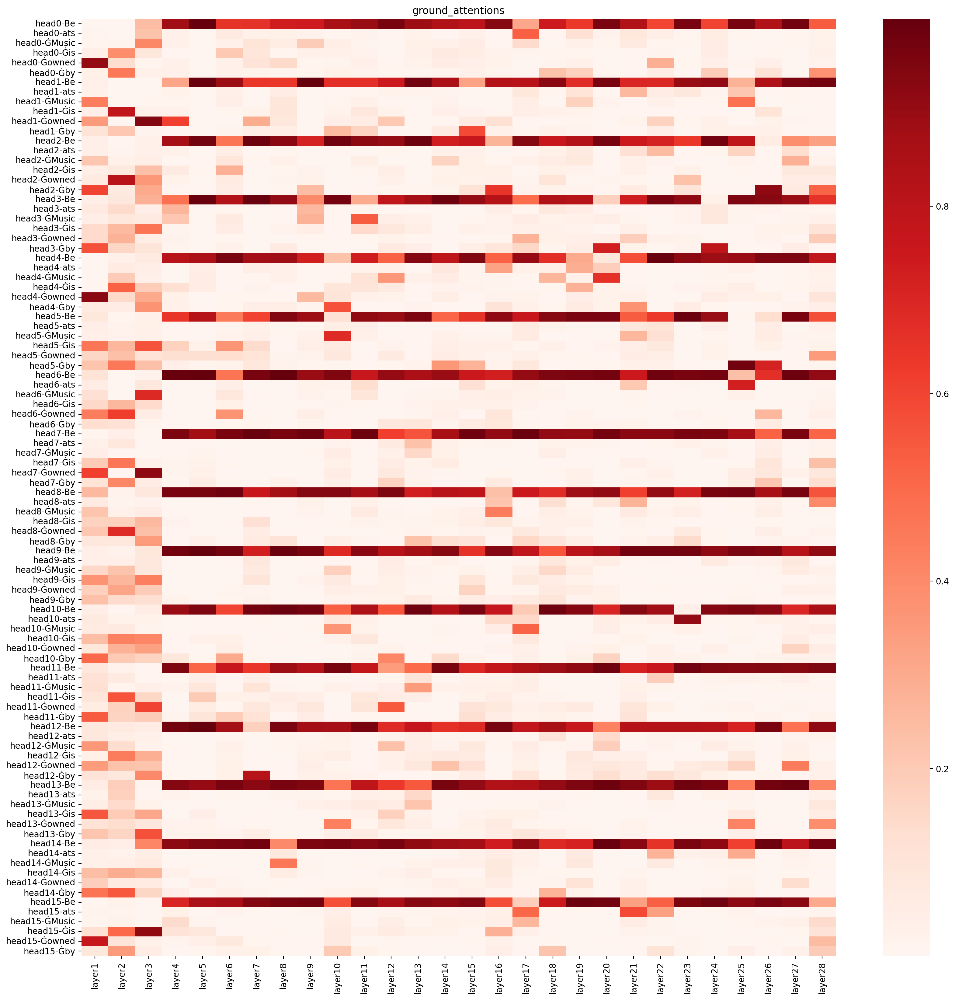

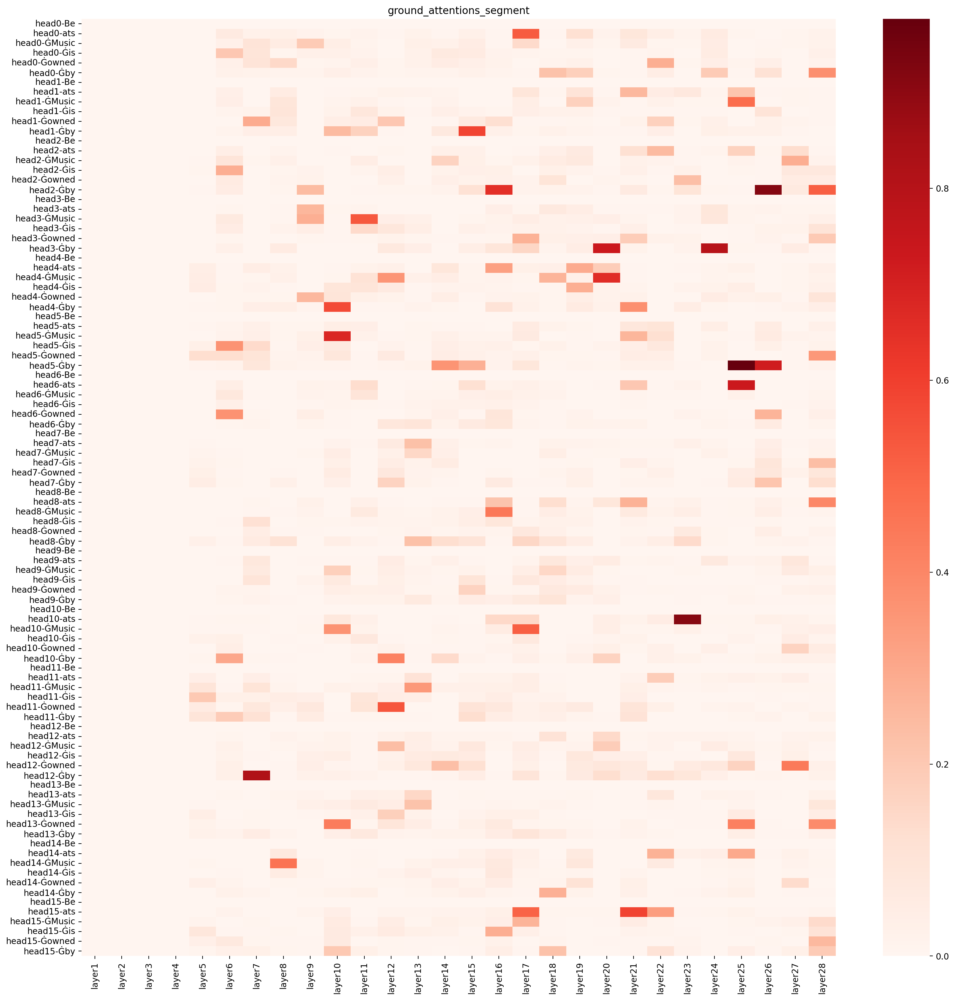

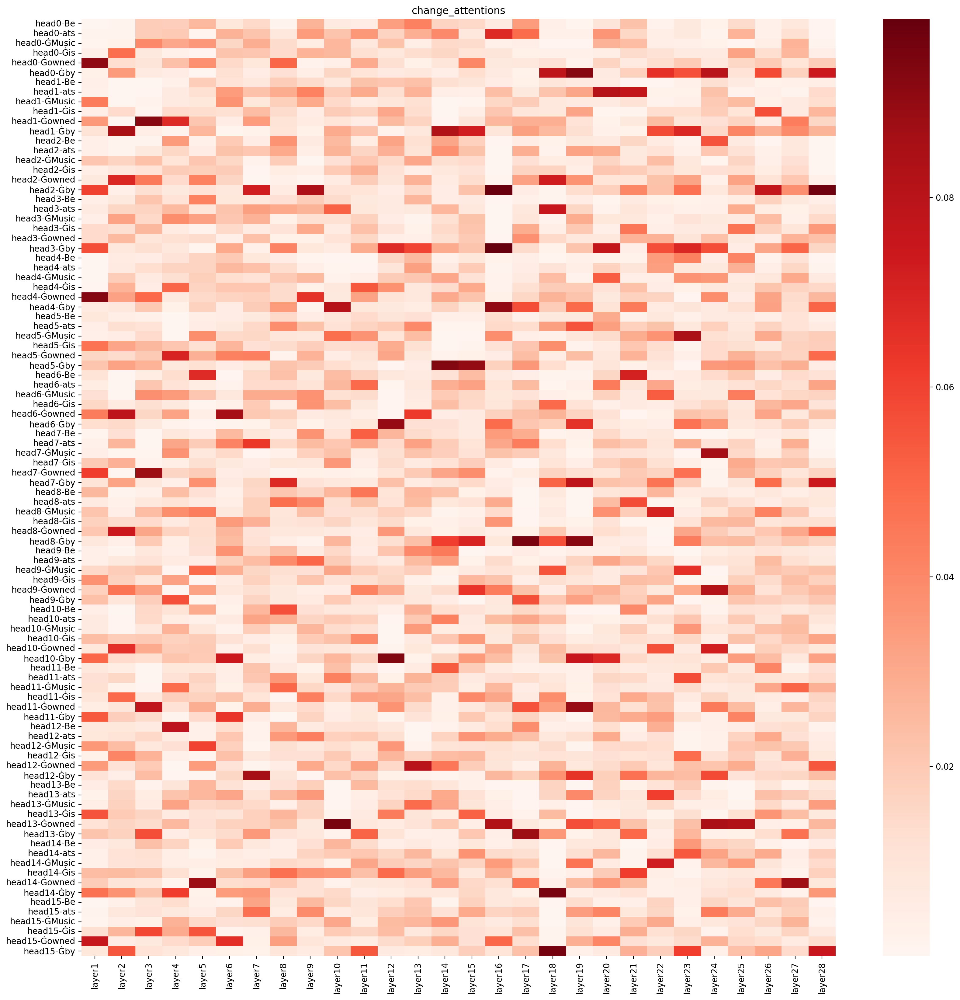

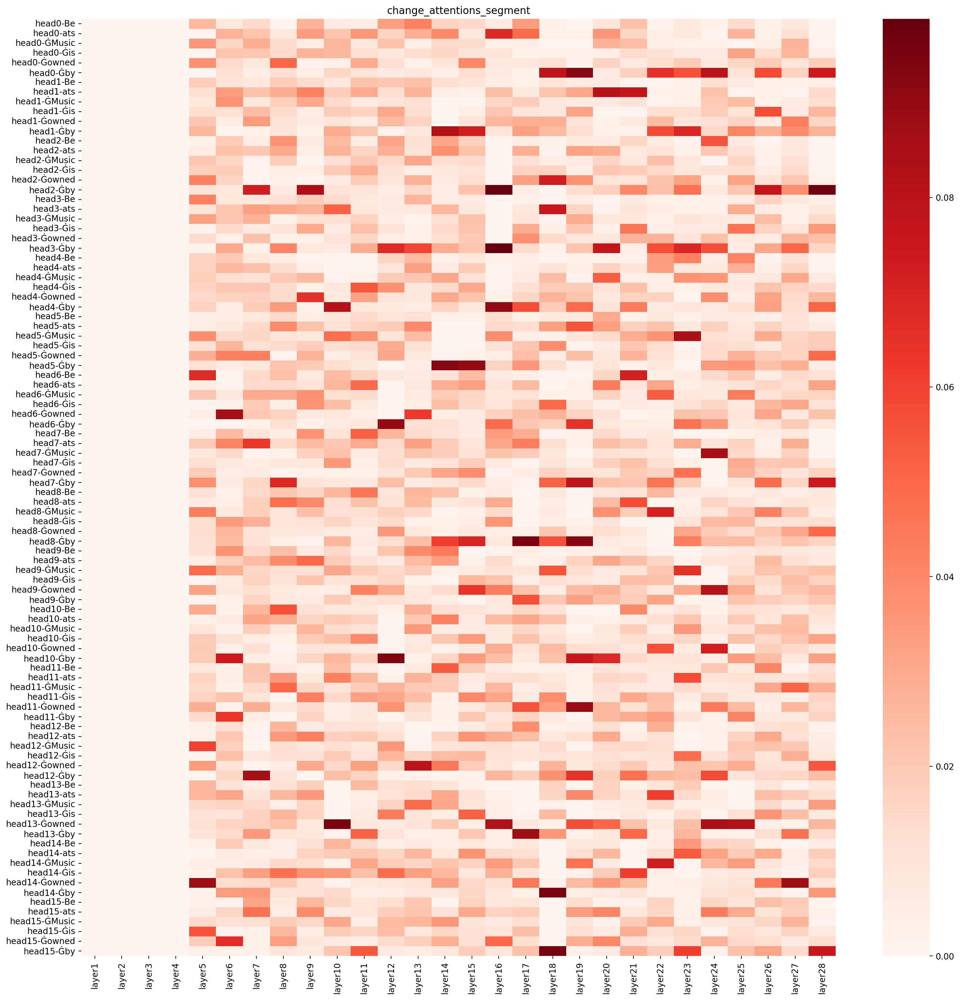

In [4]:
# model, tokenizer, model_config = load_gpt_model_and_tokenizer(model_name, device, True)
prompt =  'Beats Music is owned by' # 'Beats Music is owned by'  'The Space Needle is in downtown'

save_path = './result/atten_importance/'
x_ticks = [f"layer{i + 1}" for i in range(n_layers)]
tokenizer = AutoTokenizer.from_pretrained(model_name)
encoded_line = tokenizer.encode(prompt)
codes = tokenizer.convert_ids_to_tokens(encoded_line)

ground_attentions, change_attentions, (
original_token_pos, original_token_score, new_result_original_token_score, new_result_token_pos,
new_result_token_score, result) \
    = try_hook4(model, tokenizer, model_config, prompt, check_token_id, device)
ground_attentions,change_attentions = ground_attentions[:, :, check_token_id, :],change_attentions[:, :, check_token_id, 1:]
print(ground_attentions.shape, change_attentions.shape)
y_ticks = [f"head{i_head}-{c}" for i_head in range(n_heads) for i, c in enumerate(codes)]
plt_heatMap_sns(ground_attentions.reshape(ground_attentions.shape[0], -1).T,
                title="ground_attentions", x_ticks=x_ticks, y_ticks=y_ticks
                , show=True, save_path=save_path)
zero_attention = np.zeros_like(ground_attentions)
zero_attention[4:,:, 1:] = ground_attentions[4:,:, 1:]
plt_heatMap_sns(zero_attention.reshape(zero_attention.shape[0], -1).T,
                title="ground_attentions_segment", x_ticks=x_ticks, y_ticks=y_ticks
                , show=True, save_path=save_path)
plt_heatMap_sns(change_attentions.reshape(change_attentions.shape[0], -1).T,
                title="change_attentions", x_ticks=x_ticks, y_ticks=y_ticks
                , show=True, save_path=save_path)
zero_attention = np.zeros_like(change_attentions)
zero_attention[4:] = change_attentions[4:]
plt_heatMap_sns(zero_attention.reshape(zero_attention.shape[0], -1).T,
                title="change_attentions_segment", x_ticks=x_ticks, y_ticks=y_ticks
                , show=True, save_path=save_path)